# Testing different Adhesion Gain Values for walking using different adhesion rules and adhesion vector calculation methods:

# adhesion rules: 
">"-derivative of contact forces is bigger than zero
">="- derivative of contact forces is bigger or equal than zero

# adhesion vector calculation methods: 

## Prerun adhesion: simple method
Step 1: Run without adhesion: calculate adhesion vector 
Step 2: Run all N simulations using that adhesion vector from step 1.


## Prerun adhesion: iterative method
Step 1: Run without adhesion: calculate adhesion vector
Step 2*: Run N-simulations that each use the adhesion vector from the N-1 simulation. 


## Dynamic adhesion:
Step 1: Calculate the adhesion vector by filtering the contact forces during the simulation. 


In [1]:
import os
os.getcwd()
os.chdir('../')


In [2]:
os.getcwd()

'c:\\Users\\lschwitt\\flygym_adhesion-Laetitia'

In [3]:
#pip install -e ."[mujoco]

In [4]:
import numpy as np
import pkg_resources
import pickle
import matplotlib.pyplot as plt
from pathlib import Path
from flygym.envs.nmf_mujoco import NeuroMechFlyMuJoCo
from tqdm import trange
from flygym.util.config import all_leg_dofs
from scipy.signal import medfilt


In [5]:

# Initialize simulation
run_time = 1
nmf = NeuroMechFlyMuJoCo(render_mode='headless', #no graphic rendering: headless, rendering = 'saved'
                         timestep=1e-4,
                         #render_config={'playspeed': 0.1, 'camera': 'Animat/camera_left', 'fps' :20},
                         init_pose='stretch',
                         actuated_joints=all_leg_dofs,
                         adhesion = False,
                         actuators_adhesion_gain = 8000,#at 20500 it flies away, at 21000 it stays
                         actuated_bodies='all')

bool_sum_of_allTarsi = False
window_size_medfilt = 501

[MJCF Element: <adhesion name="LFTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="LFTarsus5" gain="8000"/>, MJCF Element: <adhesion name="LMTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="LMTarsus5" gain="8000"/>, MJCF Element: <adhesion name="LHTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="LHTarsus5" gain="8000"/>, MJCF Element: <adhesion name="RFTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="RFTarsus5" gain="8000"/>, MJCF Element: <adhesion name="RMTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="RMTarsus5" gain="8000"/>, MJCF Element: <adhesion name="RHTarsus5_adhesion" class="/" ctrlrange="0 1000000" forcerange="-inf inf" body="RHTarsus5" gain="8000"/>] actuators _adhesion


In [6]:
# Load recorded data
data_path = Path(pkg_resources.resource_filename('flygym', 'data'))
#with open(data_path / 'behavior' / '210902_pr_fly1.pkl', 'rb') as f:
#    data = pickle.load(f)
with open(data_path / 'behavior' / 'tripod_engineered.pkl', 'rb') as f:
    data = pickle.load(f)
with open(data_path / 'behavior' / 'fly_floorwalking_5cycles_tripod.pkl', 'rb') as f:
    data = pickle.load(f)

In [7]:
print('Dict keys:', data.keys())
print('Length of time series:', len(data['joint_RFCoxa']))
print('Metadata:', data['meta'])
print(2000*0.0005) # 1 second! 

Dict keys: dict_keys(['meta', 'joint_LFCoxa', 'joint_LFCoxa_roll', 'joint_LFCoxa_yaw', 'joint_LFFemur', 'joint_LFFemur_roll', 'joint_LFTibia', 'joint_LFTarsus1', 'joint_LMCoxa', 'joint_LMCoxa_roll', 'joint_LMCoxa_yaw', 'joint_LMFemur', 'joint_LMFemur_roll', 'joint_LMTibia', 'joint_LMTarsus1', 'joint_LHCoxa', 'joint_LHCoxa_roll', 'joint_LHCoxa_yaw', 'joint_LHFemur', 'joint_LHFemur_roll', 'joint_LHTibia', 'joint_LHTarsus1', 'joint_RFCoxa', 'joint_RFCoxa_roll', 'joint_RFCoxa_yaw', 'joint_RFFemur', 'joint_RFFemur_roll', 'joint_RFTibia', 'joint_RFTarsus1', 'joint_RMCoxa', 'joint_RMCoxa_roll', 'joint_RMCoxa_yaw', 'joint_RMFemur', 'joint_RMFemur_roll', 'joint_RMTibia', 'joint_RMTarsus1', 'joint_RHCoxa', 'joint_RHCoxa_roll', 'joint_RHCoxa_yaw', 'joint_RHFemur', 'joint_RHFemur_roll', 'joint_RHTibia', 'joint_RHTarsus1'])
Length of time series: 6390
Metadata: {'timestep': 0.0001, 'source': 'Analyze_step_data.ipynb'}
1.0


In [8]:
run_time = len(data['joint_RFCoxa'])*nmf.timestep

num_steps_base = int(run_time / nmf.timestep)
n_stabilisation_steps = 1000


In [9]:
# Interpolate 5x recording 
num_steps = int(run_time / nmf.timestep)
data_block = np.zeros((len(nmf.actuated_joints), num_steps))
measure_t = np.arange(len(data['joint_LFCoxa'])) * data['meta']['timestep']
interp_t = np.arange(num_steps) * nmf.timestep
for idx, joint in enumerate(nmf.actuated_joints):
    data_block[idx, :] = np.interp(interp_t, measure_t, data[joint])

In [10]:
def plot_contact_forces(obs_list_simulation, bool_sum_of_allTarsi = False, window_size_medfilt = 1):
    # tarsi
    if bool_sum_of_allTarsi:
        text_path = 'SumAllTarsi'
        tarsi = np.array(['LFTarsus', 'LMTarsus', 'LHTarsus', 'RFTarsus', 'RMTarsus', 'RHTarsus'])
        contact_forces_simulation_noADH= [[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in obs_list_simulation]



    else:
        text_path = 'onlyTarsi5'
        tarsi = np.array(['LFTarsus5', 'LMTarsus5', 'LHTarsus5', 'RFTarsus5', 'RMTarsus5', 'RHTarsus5'])
        contact_forces_simulation_noADH = [obs['contact_forces'][4::5] for obs in obs_list_simulation]

    assert window_size_medfilt % 2 == 1, "The window size for the median must be an odd integer"
    text_medfilt = ""
    if window_size_medfilt != 1:
        text_medfilt = "Median Filtered"
        

    # Extract the time and fly data for each simulation
    print(len(contact_forces_simulation_noADH))
    time_simulation = np.arange(len(contact_forces_simulation_noADH)) * nmf.timestep


    fig = plt.figure(figsize=(8, 6))

    # Plot data from the first simulation
    plt.plot(time_simulation, medfilt(contact_forces_simulation_noADH, (window_size_medfilt, 1)), linewidth=0.8)
    plt.ylabel('Contact Forces', fontsize=8)
    plt.tick_params(labelsize=8)
    #plt.ylim(0, 500)
    if bool_sum_of_allTarsi:
        plt.title(f'Sum of all Tarsi Contact Forces {text_medfilt}', fontsize=9)
    else: 
        plt.title(f'Contact Forces on Tarsi 5 {text_medfilt}', fontsize=9)


    # Create a common legend outside the subplots
    fig.legend(labels=tarsi, loc='center', ncol=len(tarsi), bbox_to_anchor=(0.5, 0), fontsize=8)
    plt.tight_layout()

    fig = plt.gcf() 
    plt.show()
    plt.draw()

    #to save:
    save_path = Path('notebooks/PreRunAdhesionFigures',f'contact_force_{text_path}_{text_medfilt.replace(" ","")}.png')
    fig.savefig(save_path)

In [13]:
def extract_end_effector_data_xyz(obs_list):
    """
    extract the positional data of the end effectors throughout the simulation. 
    returns dictionary with the x,y,z values of the end effectors
    """

    # Create a list to hold the end effector data len(end_effector_data = 18;)
    end_effector_data = [[] for _ in range(18)]

    # Iterate through each observation in obs_list
    for obs in obs_list:
        end_effectors = obs['end_effectors']

        # Iterate through each value in the end_effectors list and append to the corresponding sublist in end_effector_data
        for i, value in enumerate(end_effectors):
            end_effector_data[i].append(value)

    end_effector_data = {'x_vals_end_effector_obs' : end_effector_data[::3], 'y_vals_end_effector_obs': end_effector_data[1::3] , 'z_vals_end_effector_obs': end_effector_data[2::3]}
    return end_effector_data

In [14]:
end_effector_data = extract_end_effector_data_xyz(obs_list)

In [15]:
def plot_xyz_pos_endeffectors(end_effector_data):
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))

    # Plot 1
    ax1 = axes[0]
    for i, end_effector in enumerate(end_effector_data['z_vals_end_effector_obs']):
        ax1.plot(np.arange(len(end_effector)) * nmf.timestep,
                end_effector, linewidth = 0.8)
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('z-Position end_effectors')

    # Plot 2
    ax2 = axes[1]
    for i, end_effector in enumerate(end_effector_data['y_vals_end_effector_obs']):
        ax2.plot(np.arange(len(end_effector)) * nmf.timestep,
                end_effector, linewidth = 0.8)
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('y-Position end_effectors')

    # Plot 3
    ax3 = axes[2]
    for i, end_effector in enumerate(end_effector_data['x_vals_end_effector_obs']):
        ax3.plot(np.arange(len(end_effector)) * nmf.timestep,
                end_effector, linewidth = 0.8)
    ax3.set_xlabel('Time (s)')
    ax3.set_ylabel('x-Position end_effectors')
    fig.legend(labels = nmf.end_effector_names, loc = 'center', ncol = len(nmf.end_effector_names), bbox_to_anchor=(0.5,0))
    plt.tight_layout()
    plt.show()



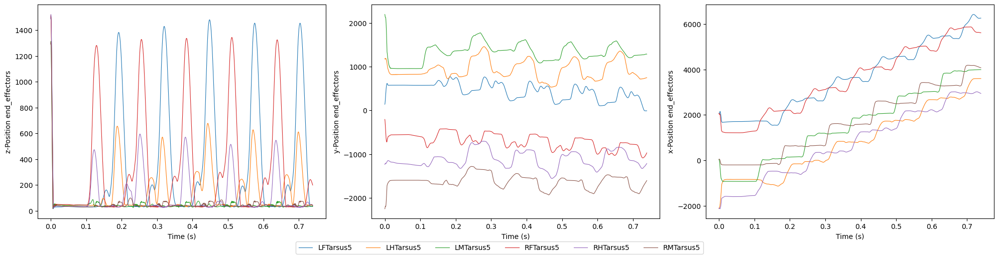

In [16]:
plot_xyz_pos_endeffectors(end_effector_data)

In [17]:

import matplotlib.transforms as transforms
def plot_xyz_endeffectors_grid(end_effector_data, fig, gridsize, nr_axes, subfigure_idx, actual_gain_adh):
    """
    end_effector_data: dict returned by the function extract_end_effector_data_xyz
    fig: plt.figure() 
    """
    ax1 = fig.add_subplot(gridsize + 1, nr_axes, subfigure_idx*nr_axes + 1)
    for i, end_effector in enumerate(end_effector_data['x_vals_end_effector_obs']):
        ax1.plot(np.arange(len(end_effector)) * nmf.timestep,
                end_effector, linewidth = 0.8)
        ax1.tick_params(labelsize=8)
        #ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('x-position \n[length]',fontsize = 8)
        trans = transforms.blended_transform_factory(ax1.transAxes, ax1.transData)
        ax1.text(0.2, 6000, f'Adhesion Gain:{int(actual_gain_adh)}', transform = trans, fontsize=8,verticalalignment='center', horizontalalignment='center')
        ax1.set_ylim(-2000,7000)
    ax2 = fig.add_subplot(gridsize + 1, nr_axes, subfigure_idx*nr_axes + 2)
    for i, end_effector in enumerate(end_effector_data['z_vals_end_effector_obs']):
        ax2.plot(np.arange(len(end_effector)) * nmf.timestep,
                end_effector, linewidth = 0.8)
        ax2.tick_params(labelsize=8)
        #ax2.set_xlabel('Time (s)')
        ax2.set_ylabel('z-position \n[length]', fontsize = 8)
        trans = transforms.blended_transform_factory(ax2.transAxes, ax2.transData)
        ax2.text(0.2, 1400, f'Adhesion Gain: {int(actual_gain_adh)}', transform = trans, fontsize=8, verticalalignment='center', horizontalalignment='center')
        ax2.set_ylim(-100,2000)
    if nr_axes == 3:
        ax3 = fig.add_subplot(gridsize + 1, nr_axes, subfigure_idx*nr_axes + 3)
        for i, end_effector in enumerate(end_effector_data['y_vals_end_effector_obs']):
            ax3.plot(np.arange(len(end_effector)) * nmf.timestep,
                    end_effector, linewidth = 0.8)
            ax3.tick_params(labelsize=8)
            #ax3.set_xlabel('Time (s)')
            ax3.set_ylabel('y-position \n[length]',fontsize = 8)
            trans = transforms.blended_transform_factory(ax3.transAxes, ax3.transData)
            ax3.set_ylim(-1000,5000)

            #ax3.text(0.2, 0.9, f'Adhesion Gain:{actual_gain_adh}', transform = trans, fontsize=8, verticalalignment='center', horizontalalignment='center')
    if subfigure_idx == 0: 
        ax1.set_title('X-Position Tarus 5',fontsize = 8)
        ax2.set_title('Z-Position Tarus 5',fontsize = 8)
        if nr_axes ==3:
            ax3.set_title('Y-Position Tarus 5',fontsize = 8)
    if subfigure_idx == gridsize: 
        ax1.set_xlabel('Time (s)',fontsize = 8)
        ax2.set_xlabel('Time (s)',fontsize = 8)
        if nr_axes ==3:
            ax3.set_xlabel('Time (s)',fontsize = 8)
    return fig






In [18]:
def plot_displacement_grid(obs_list, fig, gridsize, nr_axes, subfigure_idx, actual_gain_adh ,bool_gravity_inv):
    x_thorax_dist = []
    y_thorax_dist = []
    z_thorax_dist = []
    for obs in obs_list:
        x_thorax_dist.append(obs['fly'][0][0])
        y_thorax_dist.append(obs['fly'][0][1])
        z_thorax_dist.append(obs['fly'][0][2])

    #distance_evolution = np.linalg.norm([obs['fly'][0] - obs_list[0]['fly'][0] for obs in obs_list], axis = 1)
    if subfigure_idx == 0: 
        ax1 = fig.add_subplot(nr_axes, 1, 1)
        ax1.set_title('X-Distance Thorax',fontsize = 8)
        ax1.tick_params(labelsize=8)
        #ax1.set_xlabel('Time (s)')
        ax1.set_ylabel('x-distance \n[length]',fontsize = 8)
        ax1.set_ylim(0,6000)

        ax2 = fig.add_subplot(nr_axes, 1, 2)
        ax2.set_title('Z-Distance Thorax',fontsize = 8)
        ax2.tick_params(labelsize=8)
        #ax2.set_xlabel('Time (s)')
        ax2.set_ylabel('z-distance \n[length]', fontsize = 8)
        ax2.set_ylim(0,2000)


        if nr_axes ==3:
            ax3 = fig.add_subplot(nr_axes, 1, 3)
            ax3.set_title('Y-Distance Thorax',fontsize = 8)
            ax3.tick_params(labelsize=8)
            #ax3.set_xlabel('Time (s)')
            ax3.set_ylabel('y-distance \n[length]',fontsize = 8)
            ax3.set_ylim(-1000,5000)

    else: 
        axes = fig.get_axes()
        ax1 = axes[0]
        ax2 = axes[1]
        if nr_axes == 3:
            ax3 = axes[2]

    ax1.plot(np.arange(len(x_thorax_dist)) * nmf.timestep,
            x_thorax_dist, linewidth = 0.8, label = f'Adhesion Gain: {int(actual_gain_adh)}\nTotal Distance: {x_thorax_dist[-1] - x_thorax_dist[0]:.1f}'
)
    #ax1.set_ylim(0,6000)

    trans = transforms.blended_transform_factory(ax1.transAxes, ax1.transData)
    #ax1.text(0.2, 4000, f'Adhesion Gain:{actual_gain_adh}\nTotal Distance: {x_thorax_dist[-1]-x_thorax_dist[0]}', transform = trans, fontsize=8,
        #verticalalignment='center', horizontalalignment='center')
    ax1.legend(loc = "upper left",fontsize = 8)

    ax2.plot(np.arange(len(z_thorax_dist)) * nmf.timestep,
            z_thorax_dist, linewidth = 0.8, label = f'Adhesion Gain:{int(actual_gain_adh)}\nTotal Distance: {z_thorax_dist[-1]-z_thorax_dist[0]:.1f}')
    #ax2.set_ylim(0,6000)
    ax2.legend(loc = "upper left",fontsize = 8)

    
    trans = transforms.blended_transform_factory(ax2.transAxes, ax2.transData)
    #ax2.text(0.2, 1500, f'Adhesion Gain: {actual_gain_adh}\nTotal Distance: {z_thorax_dist[-1]-z_thorax_dist[0]}', transform = trans, fontsize=8,
    #    verticalalignment='center', horizontalalignment='center')
    
    if nr_axes == 3:
        ax3.plot(np.arange(len(y_thorax_dist)) * nmf.timestep,
                y_thorax_dist, linewidth = 0.8, label = f'Adhesion Gain:{int(actual_gain_adh)}\nTotal Distance: {y_thorax_dist[-1]-y_thorax_dist[0]:.1f}')
        #ax3.set_ylim(0,6000)


        trans = transforms.blended_transform_factory(ax3.transAxes, ax3.transData)
        ax3.legend(loc = "upper left",fontsize = 8)
        #ax3.text(0.2, 0.9, f'Adhesion Gain:{actual_gain_adh}\nTotal Distance: {y_thorax_dist[-1]-y_thorax_dist[0]}', transform = trans, fontsize=8,
        #    verticalalignment='center', horizontalalignment='center')

    if subfigure_idx == gridsize: 
        ax1.set_xlabel('Time (s)',fontsize = 8)
        ax2.set_xlabel('Time (s)',fontsize = 8)
        if nr_axes ==3:
            ax3.set_xlabel('Time (s)',fontsize = 8)
    return fig



In [19]:
def plot_displacement(obs_list, bool_gravity_inv):
    axis = ['x', 'y','z']
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))

    for i, ax in enumerate(axes): 
        #fig.add_subplot(np.arange(len([obs['fly'][0][i] for obs in obs_list])) * nmf.timestep, 130 + i, [obs['fly'][0][i] for obs in obs_list], label = "Thorax distance", xlabel = "time", ylabel = axis[i] + "thorax position" )
        ax.plot(np.arange(len([obs['fly'][0][i] for obs in obs_list])) * nmf.timestep,[obs['fly'][0][i] for obs in obs_list], label = "Thorax distance")
        ax.set_ylabel(axis[i]+ "- thorax position")
        ax.set_xlabel('Time (s)')
    plt.legend()
    plt.subplots_adjust(wspace=0.4)

    # plt.ylabel('x- Position end_effectors')
    if bool_gravity_inv:
        plt.suptitle('... inverted gravity')
    else: 
        plt.suptitle('... gravity normal')

In [30]:
def run_adhesion_sim(nmf, data_block, adhesion_obs, num_steps, n_stabilisation_steps= 1000, bool_gravity_inv = False, adhesion_gain_multiply =1):
    assert adhesion_gain_multiply != 0, "adhesion gain multplier should not be 0"
    # Run simulation
    obs, info = nmf.reset() 
    if bool_gravity_inv:
        nmf.physics.model.opt.gravity = (0,0,9.81e5)
    else:
        nmf.physics.model.opt.gravity = (0,0,-9.81e5)
    obs_list = [obs]
    for i in range(num_steps + n_stabilisation_steps):
        if i < n_stabilisation_steps:
            joint_pos = data_block[:, 0] 
            action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*np.array(adhesion_obs)[0,:]}
        else: 

            joint_pos = data_block[:, i-n_stabilisation_steps] #put back i 
            #calculate adhesion
            action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*np.array(adhesion_obs)[i,:]} 
        obs, info = nmf.step(action)
        
        nmf.render()
        obs_list.append(obs)
    return obs_list

# Iter method

>
True
160000


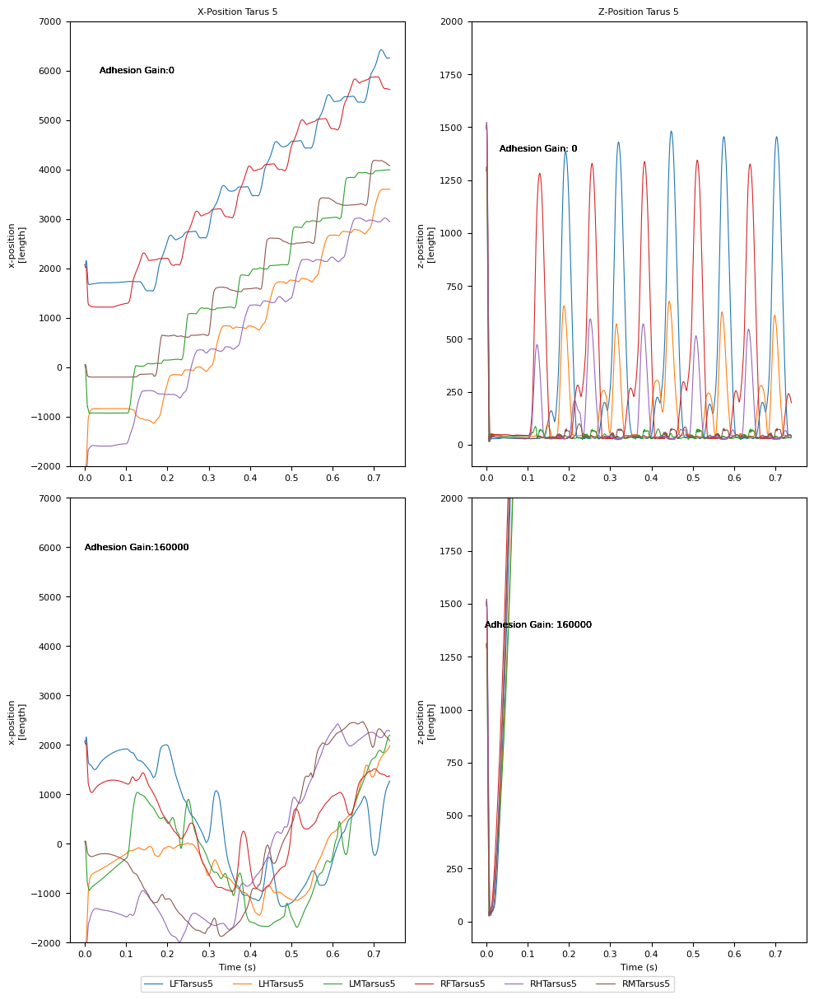

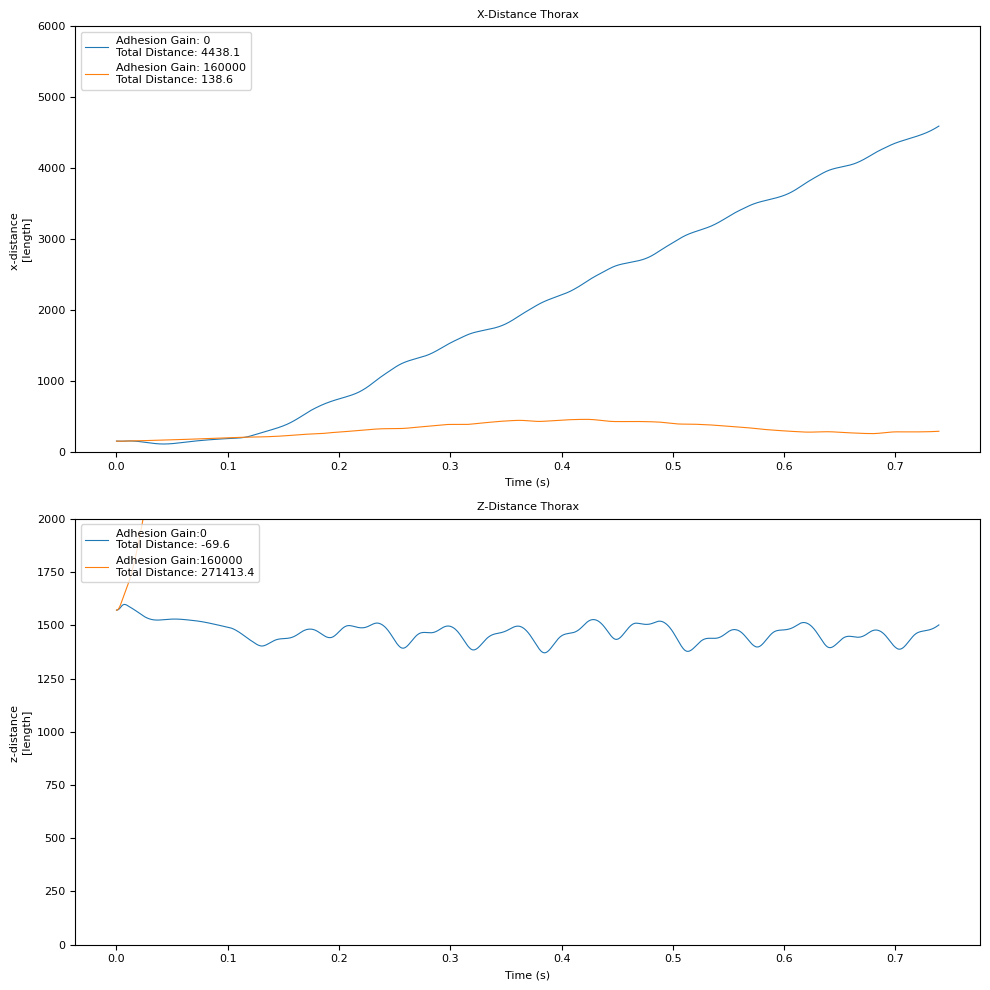

False
400.0
872.7272727272726
1345.4545454545453
1818.1818181818178
2290.9090909090905
2763.636363636363
3236.363636363636
3709.0909090909086


<Figure size 640x480 with 0 Axes>

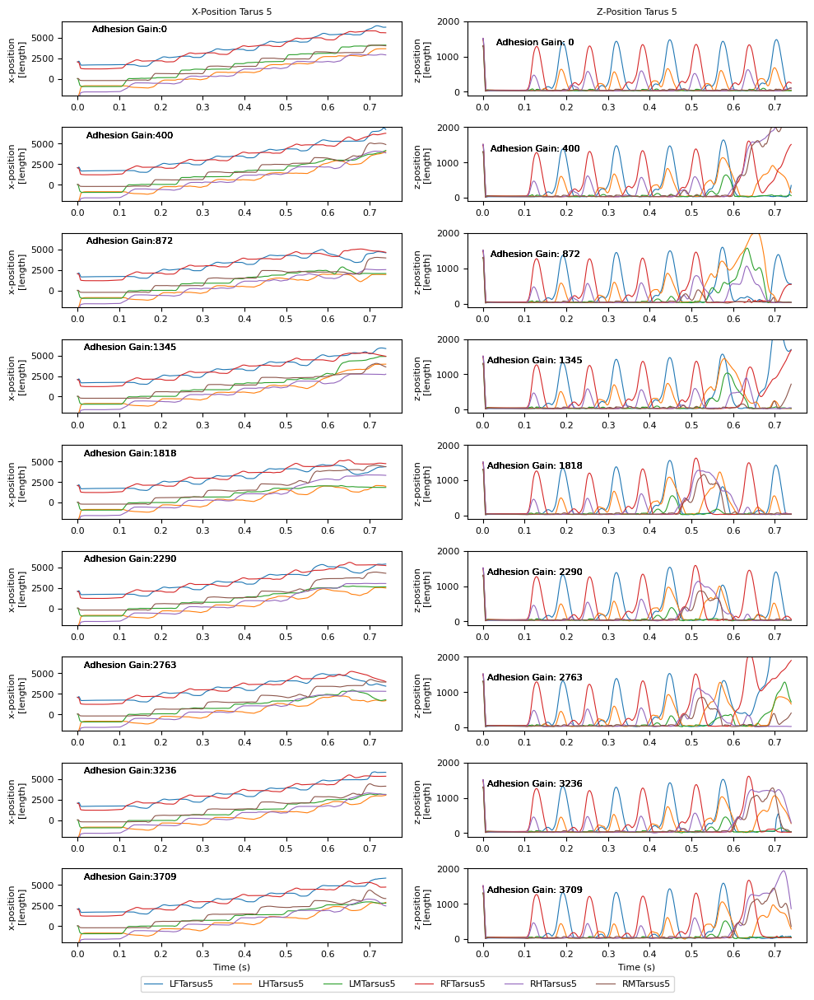

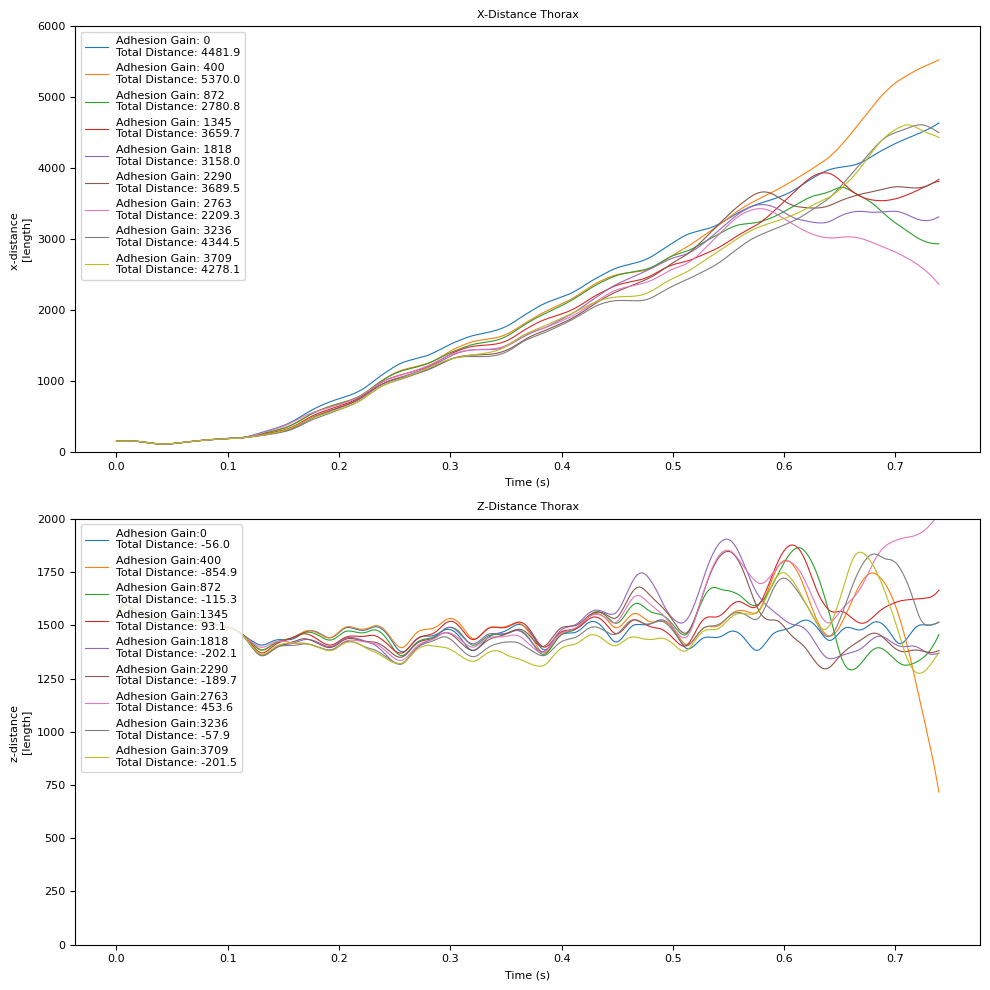

>=
True
5600.0
5127.272727272727
4654.545454545454
4181.818181818182
3709.0909090909086
3236.363636363636


<Figure size 640x480 with 0 Axes>

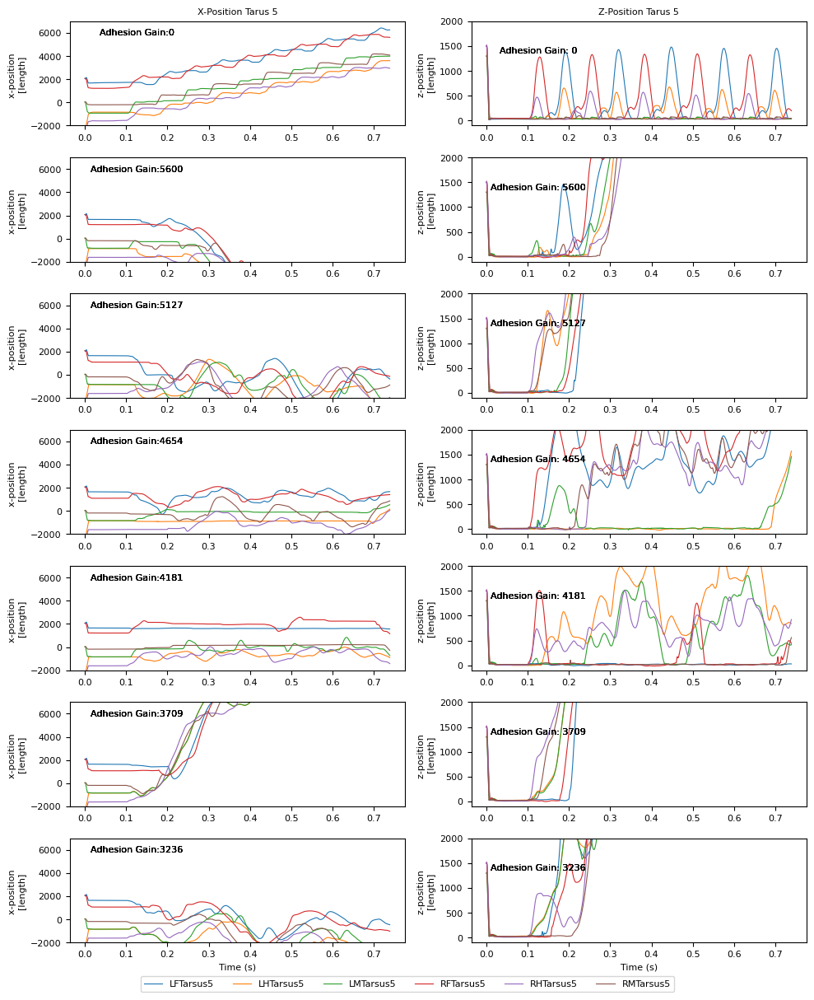

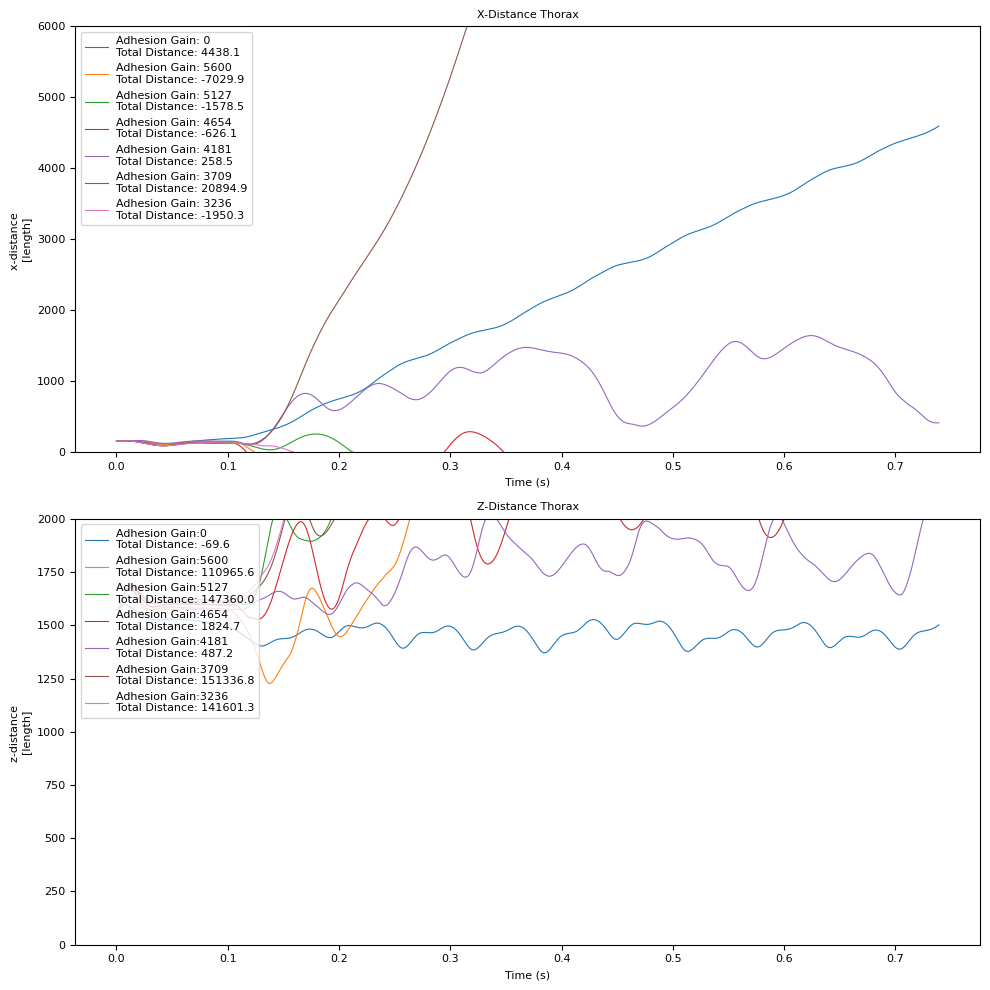

False
400.0
872.7272727272726
1345.4545454545453
1818.1818181818178
2290.9090909090905
2763.636363636363
3236.363636363636
3709.0909090909086


<Figure size 640x480 with 0 Axes>

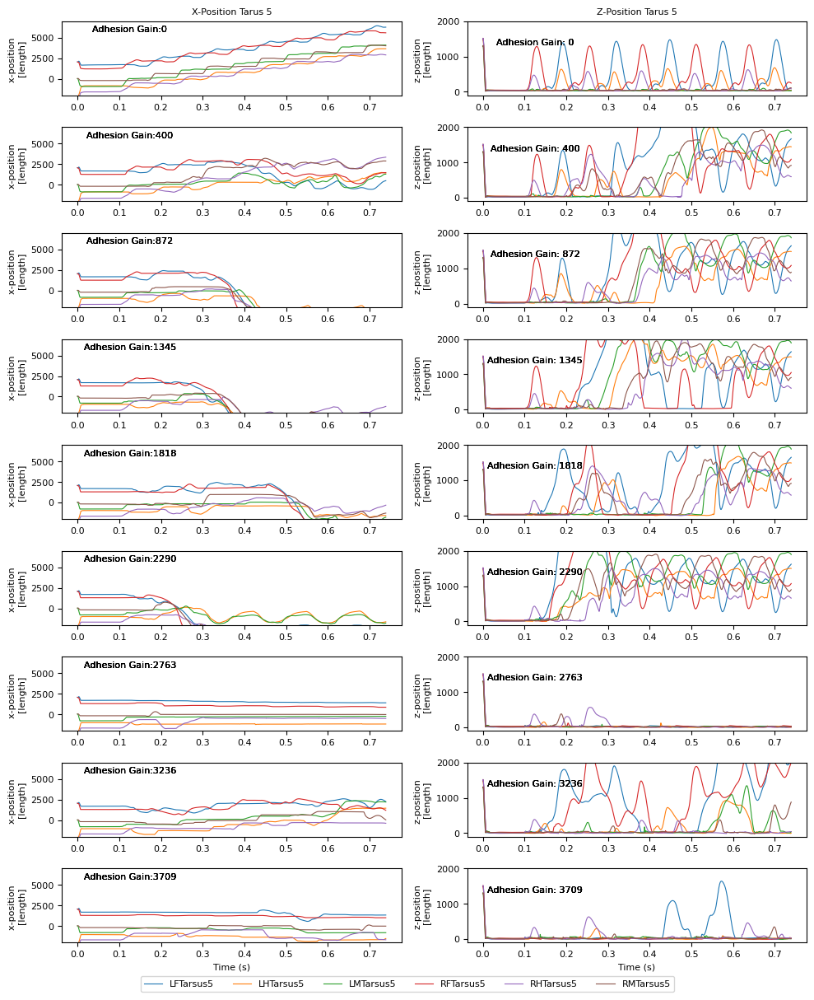

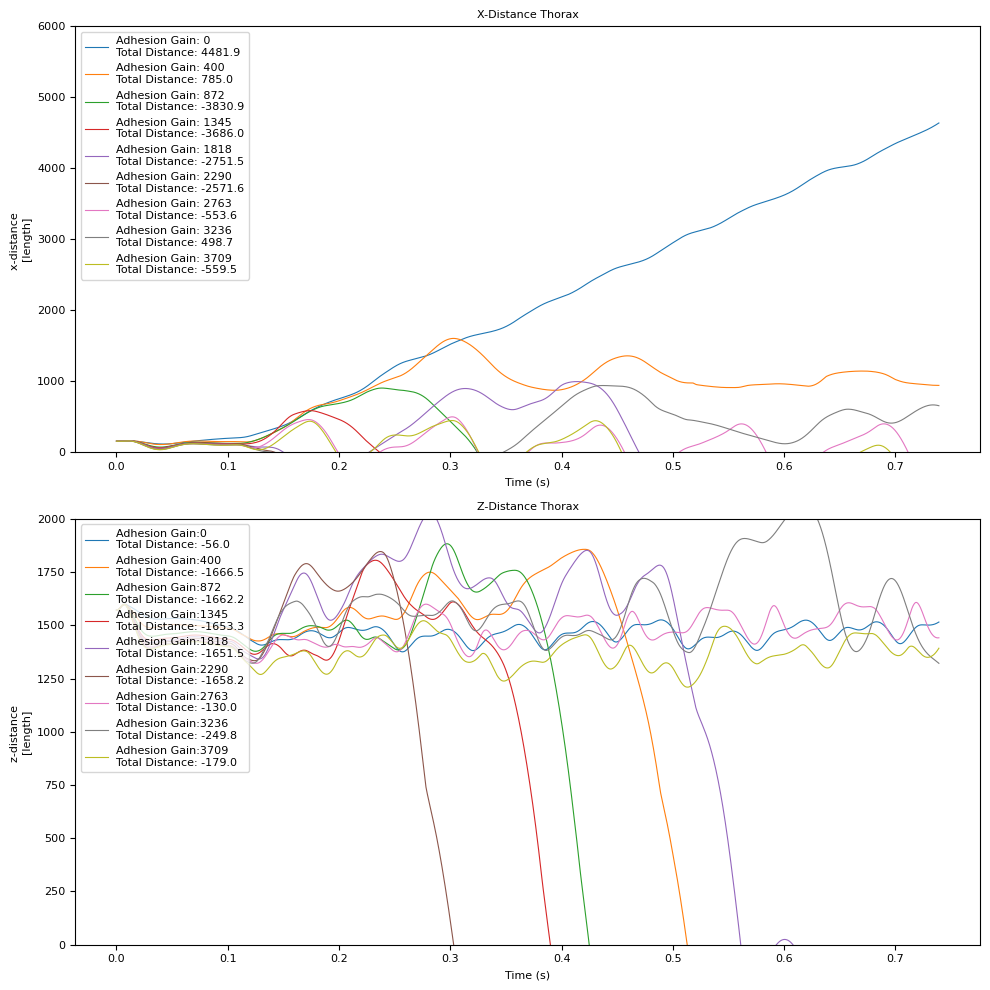

<Figure size 640x480 with 0 Axes>

In [31]:
adhesion_gain_multipliers = np.linspace(0.05,0.7,12)#([0.25,0.5,0.75,1,2,4,8]) #np.linspace(0.05,0.5,10)
#adhesion_gain_multipliers = np.array([0.5])
adhesion_gain_multipliers_og = adhesion_gain_multipliers.copy()
bool_gravity_inv_lists = [True,False]
#bool_gravity_inv = True # False: normal gravity, True: inv gravity
adh_rules = [">", ">="]
#adh_rule = ">="
for adh_rule in adh_rules:
    print(adh_rule)
    for bool_gravity_inv in bool_gravity_inv_lists:
        if bool_gravity_inv:
            if adh_rule ==">":
                adhesion_gain_multipliers = [20]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
    
            elif adh_rule ==">=":
                adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers_og.copy())[:6]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
        else: 
            if adh_rule ==">":
                adhesion_gain_multipliers = adhesion_gain_multipliers_og[:8]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
            elif adh_rule ==">=":
                adhesion_gain_multipliers = adhesion_gain_multipliers_og[:8]
                #adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers_og.copy())[:6]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'IterMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')

        """
        if bool_gravity_inv:
            adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers)
        else:
            adhesion_gain_multipliers = adhesion_gain_multipliers_og
        """

        print(bool_gravity_inv)
        adhesion_obs = np.zeros((num_steps + n_stabilisation_steps,6))

        #for end_effectors figure
        fig_all_endeffectors_grid = plt.figure(figsize=(10,12))
        fig_all_displacements_grid = plt.figure(figsize=(10,10))
        gridsize = len(adhesion_gain_multipliers) # nr of params in the grid (10) + the normal one
        nr_axes_endeffectors = 2
        nr_axes_displacement = 2
        #run no adhesion
        obs_list_noADH = run_adhesion_sim(nmf, data_block, adhesion_obs, num_steps, n_stabilisation_steps, bool_gravity_inv = False, adhesion_gain_multiply=1)
        if bool_sum_of_allTarsi:
            contact_forces_simulation_noADH= [[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in obs_list_noADH]



        else:
            contact_forces_simulation_noADH = [obs['contact_forces'][4::5] for obs in obs_list_noADH]
        medfiltered_contact_forces = medfilt(contact_forces_simulation_noADH, (window_size_medfilt, 1))
        derivative = np.gradient(medfiltered_contact_forces,nmf.timestep, axis=0)
        assert adh_rule in adh_rules, "you must add a new adhesion rule"


        end_effector_data_noADH = extract_end_effector_data_xyz(obs_list_noADH)
        #plot_xyz_pos_endeffectors(end_effector_data_noADH)
        fig_all_endeffectors_grid = plot_xyz_endeffectors_grid(end_effector_data_noADH, fig_all_endeffectors_grid, gridsize, nr_axes_endeffectors,subfigure_idx=0, actual_gain_adh=0)
        fig_all_displacements_grid = plot_displacement_grid(obs_list_noADH, fig_all_displacements_grid, gridsize,nr_axes_displacement,subfigure_idx=0, actual_gain_adh=0, bool_gravity_inv=bool_gravity_inv)
        #plot_displacement(obs_list_noADH, bool_gravity_inv = False)

        #run grid
        for idx, adhesion_gain_multiplier in enumerate(adhesion_gain_multipliers): 
            if adh_rule == ">":
                adhesion_obs = np.where(np.array(derivative)> 0, 1, 0)
            elif adh_rule == ">=":
                adhesion_obs = np.where(np.array(derivative)>= 0, 1, 0)  
            #adding adhesion to the initial tripod
            #adhesion_obs[:n_stabilisation_steps] = np.tile(np.array([1,0,1,0,1,0]), (n_stabilisation_steps, 1))
            obs_list = run_adhesion_sim(nmf,data_block,adhesion_obs,num_steps,n_stabilisation_steps,bool_gravity_inv,adhesion_gain_multiplier)
            if bool_sum_of_allTarsi:
                contact_forces_simulation= [[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in obs_list]

            else:
                contact_forces_simulation = [obs['contact_forces'][4::5] for obs in obs_list]
            medfiltered_contact_forces = medfilt(contact_forces_simulation, (window_size_medfilt, 1))
            derivative = np.gradient(medfiltered_contact_forces,nmf.timestep, axis=0)
            assert adh_rule in adh_rules, "you must add a new adhesion rule"
        
            actual_gain_adh = nmf.actuators_adhesion_gain * adhesion_gain_multiplier
            end_effector_data = extract_end_effector_data_xyz(obs_list)
            #plot_xyz_pos_endeffectors(end_effector_data)
            fig_all_endeffectors_grid = plot_xyz_endeffectors_grid(end_effector_data, fig_all_endeffectors_grid, gridsize, nr_axes_endeffectors,subfigure_idx=idx + 1,actual_gain_adh=actual_gain_adh)
            fig_all_displacements_grid = plot_displacement_grid(obs_list, fig_all_displacements_grid, gridsize,nr_axes_displacement,subfigure_idx=idx+1, actual_gain_adh=actual_gain_adh, bool_gravity_inv=bool_gravity_inv)

            #plot_displacement(obs_list, bool_gravity_inv)
            print(actual_gain_adh)
            
        fig_all_endeffectors_grid.legend(labels = nmf.end_effector_names, loc = 'center', ncol = len(nmf.end_effector_names), bbox_to_anchor=(0.5,0), fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_endeffectors_grid.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_endeffectors_grid)

        #fig_all_displacements_grid.legend(fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_displacements_grid.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_displacements_grid)
        plt.show()
        plt.draw()
        fig_all_endeffectors_grid.savefig(savefig_path_effector)
        fig_all_displacements_grid.savefig(savefig_path_distance)






# Simple Method

gravity on: True
[0.7        0.64090909 0.58181818 0.52272727 0.46363636 0.40454545
 0.34545455 0.28636364 0.22727273 0.16818182 0.10909091 0.05      ]
adh_rule, >
5600.0
5127.272727272727
4654.545454545454
4181.818181818182
3709.0909090909086
3236.363636363636
2763.636363636363
2290.9090909090905
1818.1818181818178
1345.4545454545453
872.7272727272726
400.0


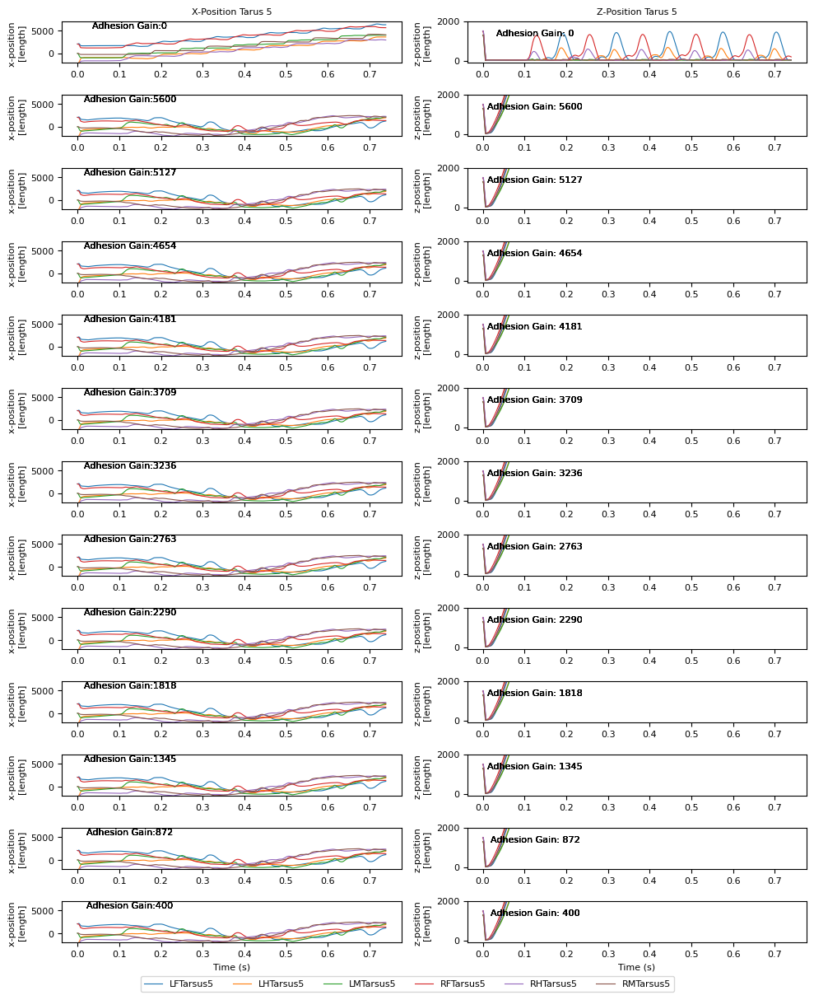

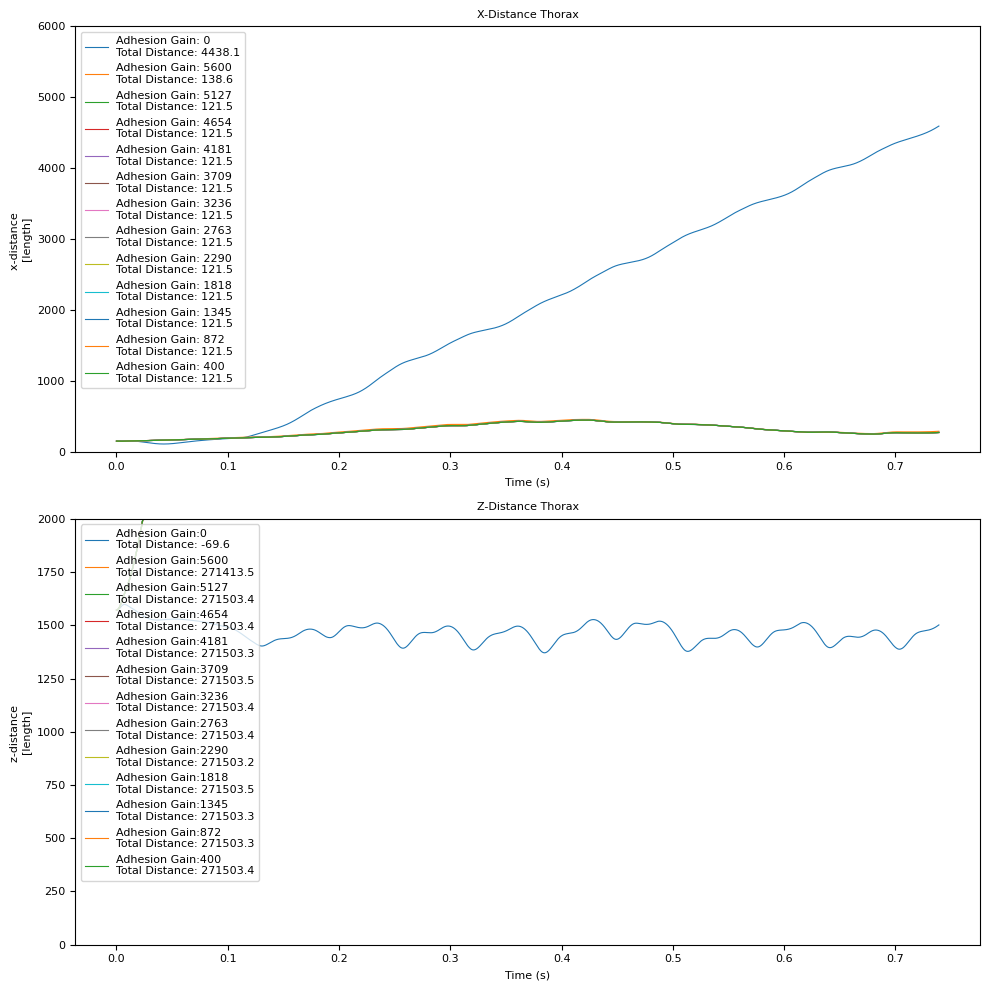

[0.7        0.64090909 0.58181818 0.52272727 0.46363636 0.40454545
 0.34545455 0.28636364 0.22727273 0.16818182 0.10909091 0.05      ]
adh_rule, >=
5600.0
5127.272727272727
4654.545454545454
4181.818181818182
3709.0909090909086
3236.363636363636
2763.636363636363
2290.9090909090905
1818.1818181818178
1345.4545454545453
872.7272727272726
400.0


<Figure size 640x480 with 0 Axes>

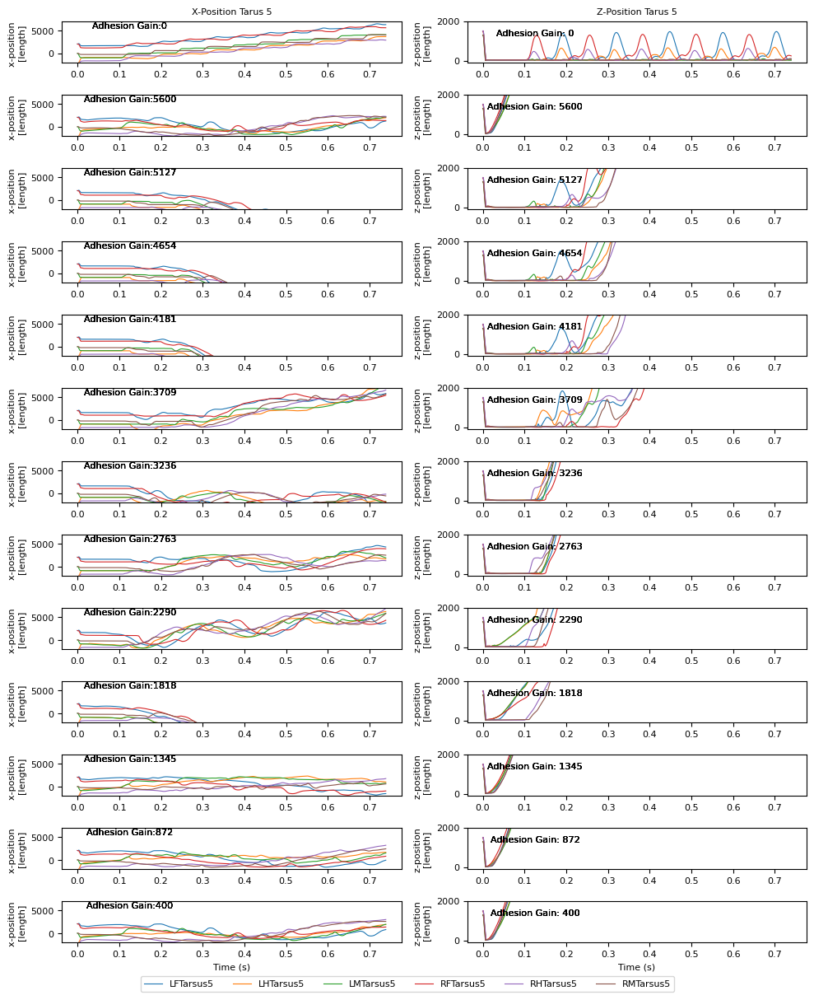

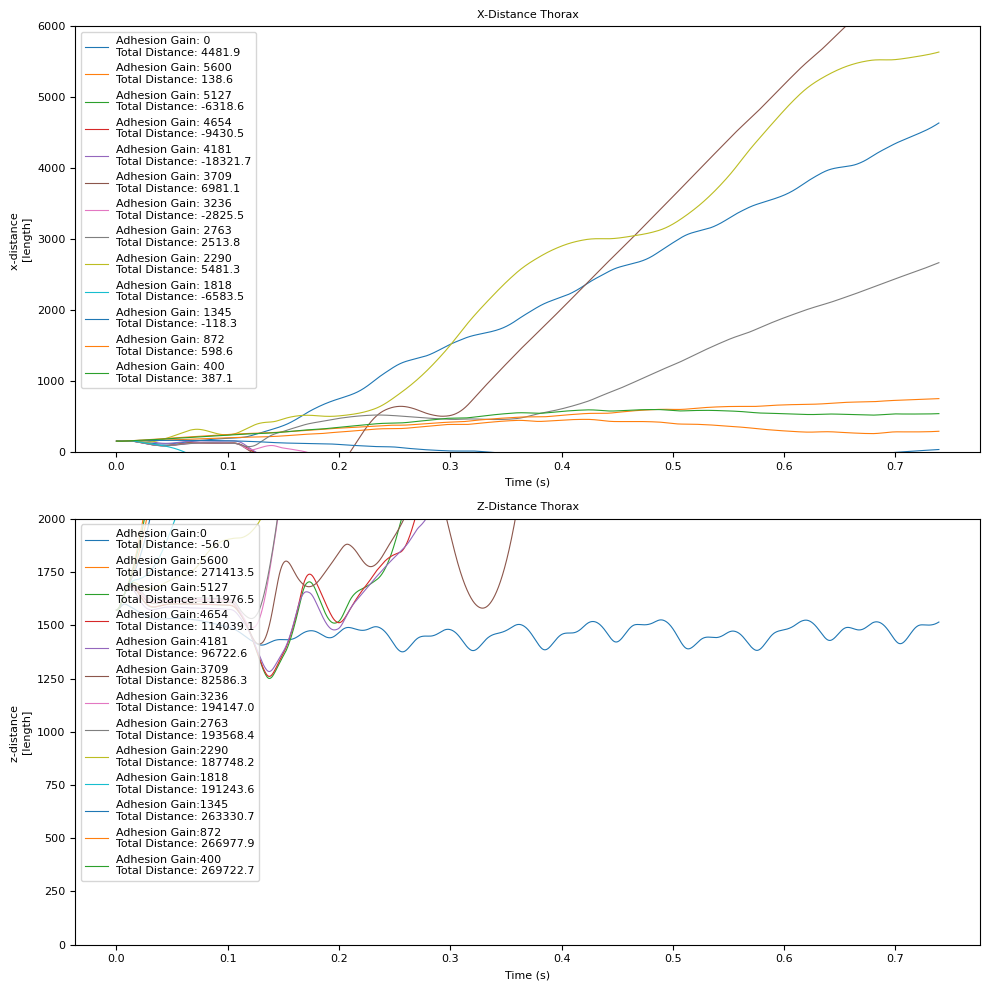

gravity on: False
[0.05       0.10909091 0.16818182 0.22727273 0.28636364 0.34545455
 0.40454545 0.46363636]
adh_rule, >
400.0
872.7272727272726
1345.4545454545453
1818.1818181818178
2290.9090909090905
2763.636363636363
3236.363636363636
3709.0909090909086


<Figure size 640x480 with 0 Axes>

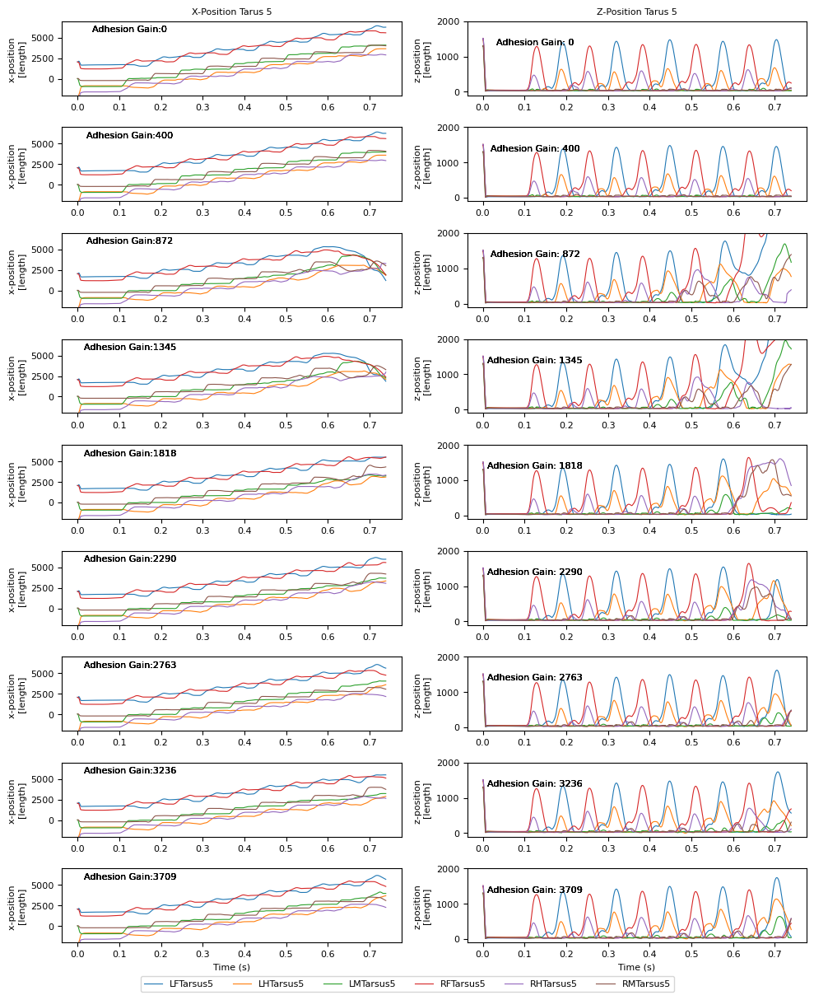

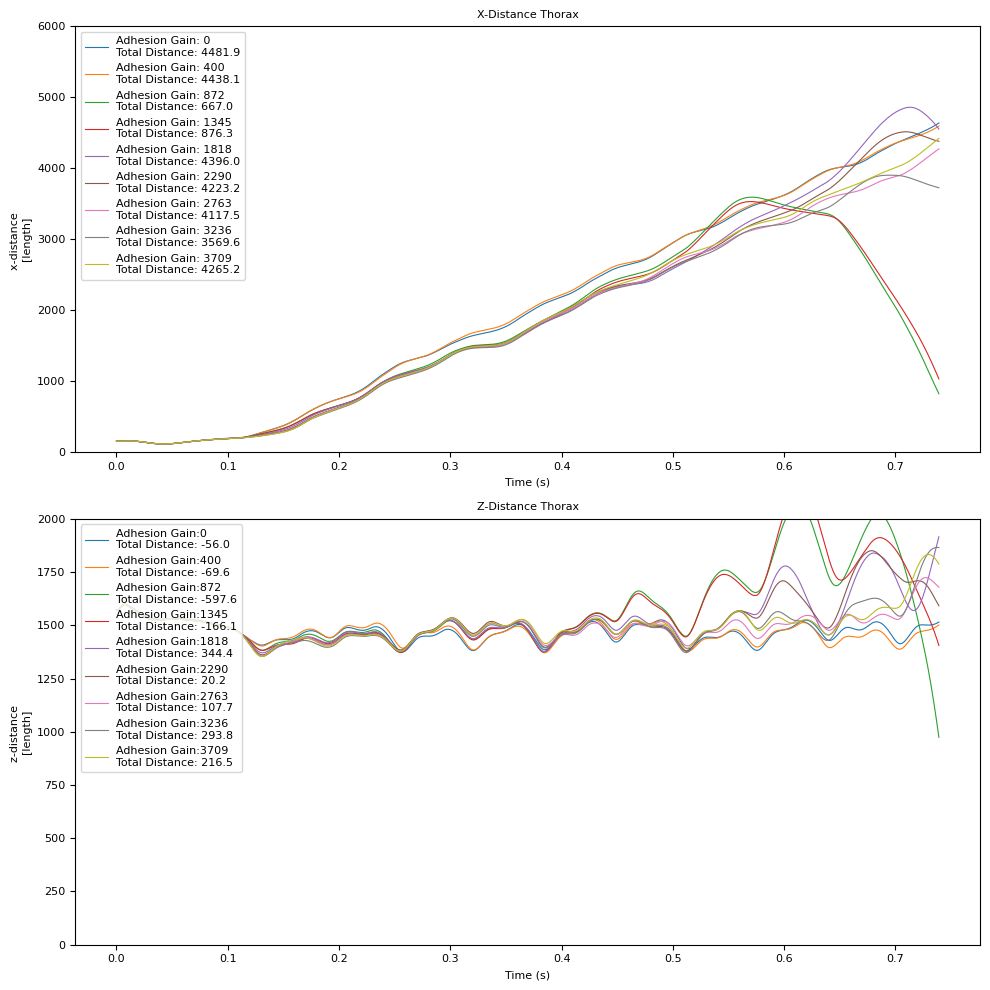

[0.05       0.10909091 0.16818182 0.22727273 0.28636364 0.34545455
 0.40454545 0.46363636]
adh_rule, >=
400.0
872.7272727272726
1345.4545454545453
1818.1818181818178
2290.9090909090905
2763.636363636363
3236.363636363636
3709.0909090909086


<Figure size 640x480 with 0 Axes>

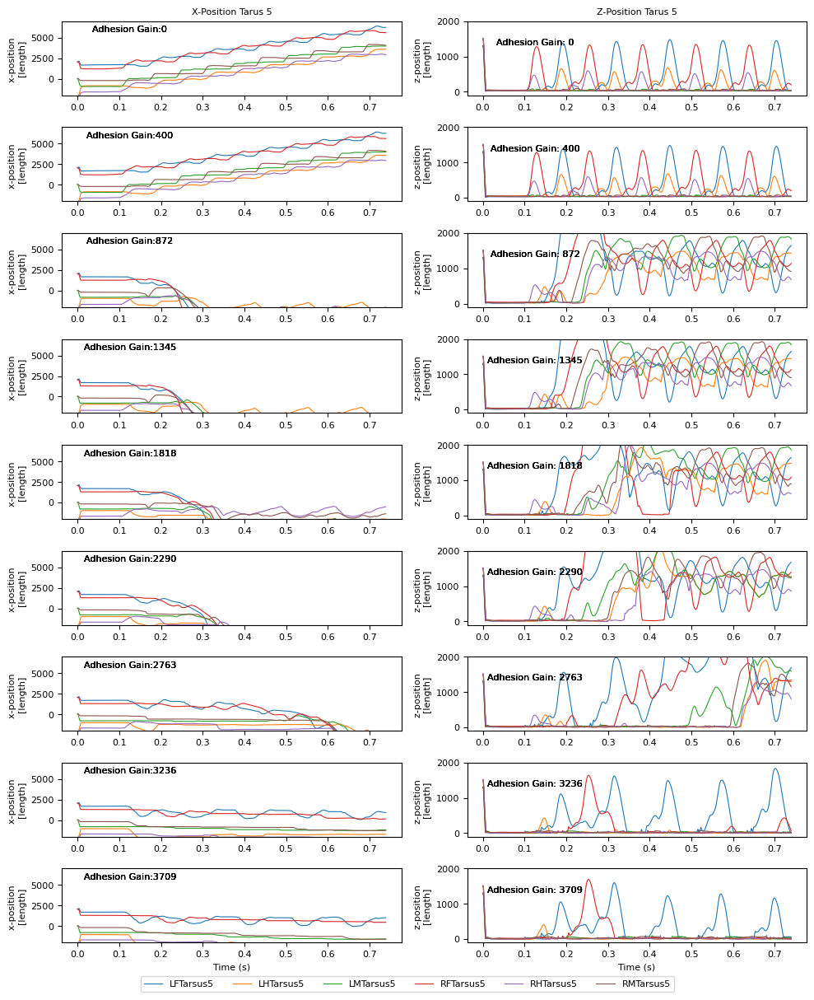

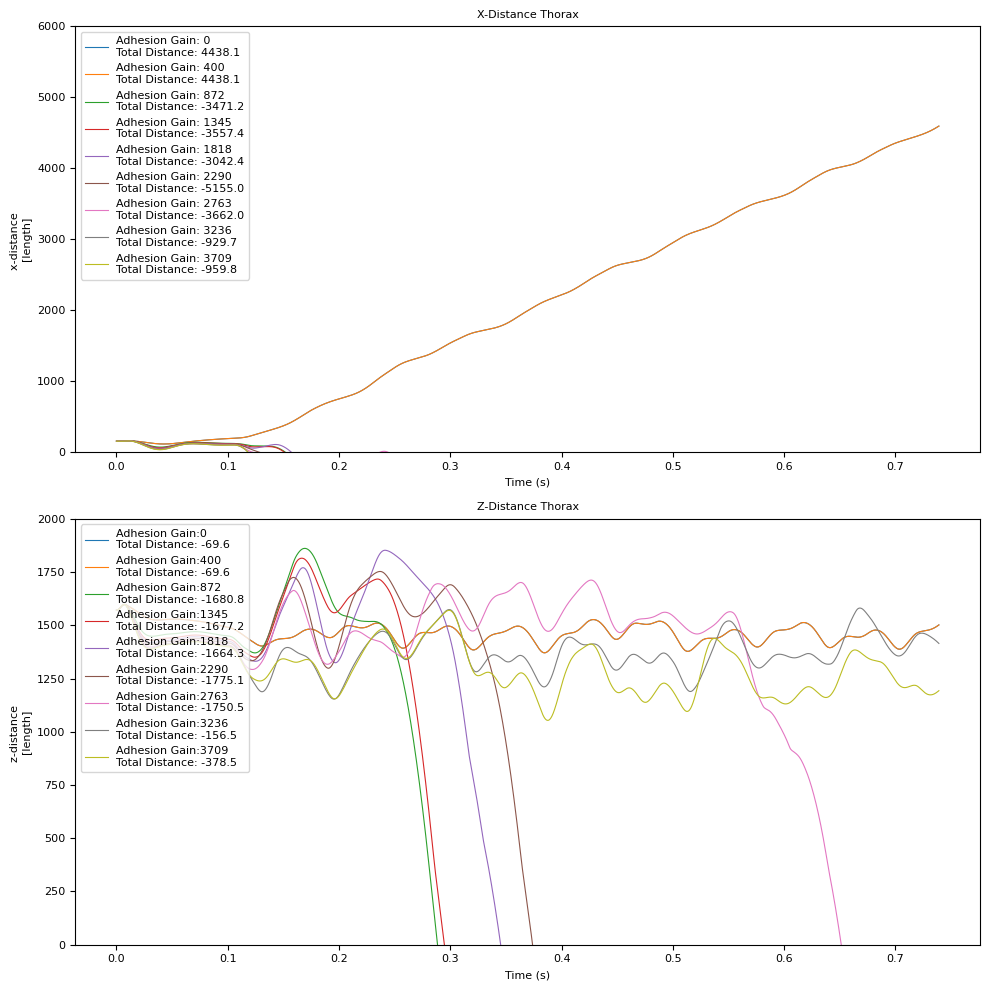

<Figure size 640x480 with 0 Axes>

In [34]:
adhesion_gain_multipliers = np.linspace(0.05,0.7,12)#np.array([0.25,0.5,0.75,1,2,4,8])
adhesion_gain_multipliers_og = adhesion_gain_multipliers.copy()

#adhesion_gain_multipliers = np.array([0.5])

adhesion_obs = np.zeros((num_steps + n_stabilisation_steps,6))
bool_gravity_inv_lists = [True, False]
#bool_gravity_inv = True # False: normal gravity, True: inv gravity
adh_rules = [">", ">="]
#adh_rule = ">="
for bool_gravity_inv in bool_gravity_inv_lists:
    """
    if bool_gravity_inv:
        adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers)
    else:
        adhesion_gain_multipliers = adhesion_gain_multipliers_og
    """

    print(f"gravity on: {bool_gravity_inv}")
    for adh_rule in adh_rules: 

        if bool_gravity_inv:
            if adh_rule ==">":
                adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers_og.copy())
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')

            elif adh_rule ==">=":
                adhesion_gain_multipliers = np.flip(adhesion_gain_multipliers_og.copy())
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
        else: 
            if adh_rule ==">":
                adhesion_gain_multipliers = adhesion_gain_multipliers_og[:8]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
            elif adh_rule ==">=":
                adhesion_gain_multipliers = adhesion_gain_multipliers_og[:8]
                savefig_path_effector = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'SimpleMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
        print(adhesion_gain_multipliers)
        print("adh_rule,", adh_rule)
        adhesion_obs = np.zeros((num_steps + n_stabilisation_steps,6))

        #for end_effectors figure
        fig_all_endeffectors_grid = plt.figure(figsize=(10,12))
        fig_all_displacements_grid = plt.figure(figsize=(10,10))
        gridsize = len(adhesion_gain_multipliers) # nr of params in the grid (10) + the normal one
        nr_axes_endeffectors = 2
        nr_axes_displacement = 2
        #run no adhesion
        obs_list_noADH = run_adhesion_sim(nmf, data_block, adhesion_obs, num_steps, n_stabilisation_steps, bool_gravity_inv = False, adhesion_gain_multiply=1)
        end_effector_data_noADH = extract_end_effector_data_xyz(obs_list_noADH)
        #plot_xyz_pos_endeffectors(end_effector_data_noADH)
        fig_all_endeffectors_grid = plot_xyz_endeffectors_grid(end_effector_data_noADH, fig_all_endeffectors_grid, gridsize, nr_axes_endeffectors,subfigure_idx=0, actual_gain_adh=0)
        fig_all_displacements_grid = plot_displacement_grid(obs_list_noADH, fig_all_displacements_grid, gridsize,nr_axes_displacement,subfigure_idx=0, actual_gain_adh=0, bool_gravity_inv=bool_gravity_inv)
        #plot_displacement(obs_list_noADH, bool_gravity_inv = False)

        if bool_sum_of_allTarsi:
            contact_forces_simulation_noADH= [[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in obs_list_noADH]

        else:
            contact_forces_simulation_noADH = [obs['contact_forces'][4::5] for obs in obs_list_noADH]
        medfiltered_contact_forces = medfilt(contact_forces_simulation_noADH, (window_size_medfilt, 1))
        derivative = np.gradient(medfiltered_contact_forces,nmf.timestep, axis=0)

        #run grid
        for idx, adhesion_gain_multiplier in enumerate(adhesion_gain_multipliers): 
            #adding adhesion to the initial tripod
            #adhesion_obs[:n_stabilisation_steps] = np.tile(np.array([1,0,1,0,1,0]), (n_stabilisation_steps, 1))

            obs_list = run_adhesion_sim(nmf,data_block,adhesion_obs,num_steps,n_stabilisation_steps,bool_gravity_inv,adhesion_gain_multiplier)

            assert adh_rule in adh_rules, "you must add a new adhesion rule"

            if adh_rule == ">":
                adhesion_obs = np.where(np.array(derivative)> 0, 1, 0)
            elif adh_rule == ">=":
                adhesion_obs = np.where(np.array(derivative)>= 0, 1, 0)    
            actual_gain_adh = nmf.actuators_adhesion_gain * adhesion_gain_multiplier
            end_effector_data = extract_end_effector_data_xyz(obs_list)
            #plot_xyz_pos_endeffectors(end_effector_data)
            fig_all_endeffectors_grid = plot_xyz_endeffectors_grid(end_effector_data, fig_all_endeffectors_grid, gridsize, nr_axes_endeffectors,subfigure_idx=idx + 1,actual_gain_adh=actual_gain_adh)
            fig_all_displacements_grid = plot_displacement_grid(obs_list, fig_all_displacements_grid, gridsize,nr_axes_displacement,subfigure_idx=idx+1, actual_gain_adh=actual_gain_adh, bool_gravity_inv=bool_gravity_inv)

            #plot_displacement(obs_list, bool_gravity_inv)
            print(actual_gain_adh)
            
        fig_all_endeffectors_grid.legend(labels = nmf.end_effector_names, loc = 'center', ncol = len(nmf.end_effector_names), bbox_to_anchor=(0.5,0), fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_endeffectors_grid.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_endeffectors_grid)

        #fig_all_displacements_grid.legend(fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_displacements_grid.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_displacements_grid)
        plt.show()
        plt.draw()
        fig_all_endeffectors_grid.savefig(savefig_path_effector)
        fig_all_displacements_grid.savefig(savefig_path_distance)





In [35]:
# Run simulation
obs, info = nmf.reset() 
old_obs = obs
obs_list = [obs]
for idx in range(num_steps + n_stabilisation_steps):
    if idx < n_stabilisation_steps:
        joint_pos = data_block[:, 0] 
        action = {'joints': joint_pos, 'adhesion': np.array(adhesion_obs)[idx,:]} 

    else:
        joint_pos = data_block[:, idx-n_stabilisation_steps] #put back i 
        #calculate adhesion
        action = {'joints': joint_pos, 'adhesion': np.array(adhesion_obs)[idx,:]} 
    old_obs = obs
    obs, info = nmf.step(action)
    
    nmf.render()
    obs_list.append(obs)

In [36]:
afterrun_contact = []
for obs in obs_list:
    afterrun_contact.append(obs['contact_forces'][4::5])  

In [37]:
end_effector_data = extract_end_effector_data_xyz(obs_list)

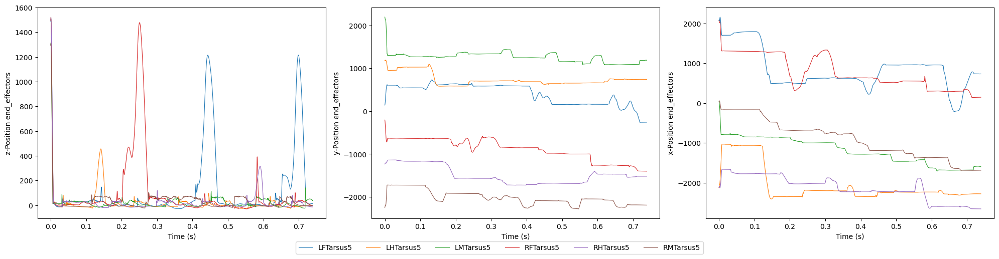

In [38]:
plot_xyz_pos_endeffectors(end_effector_data)

Text(0.5, 0.98, 'after timed adhesion and gravity normal')

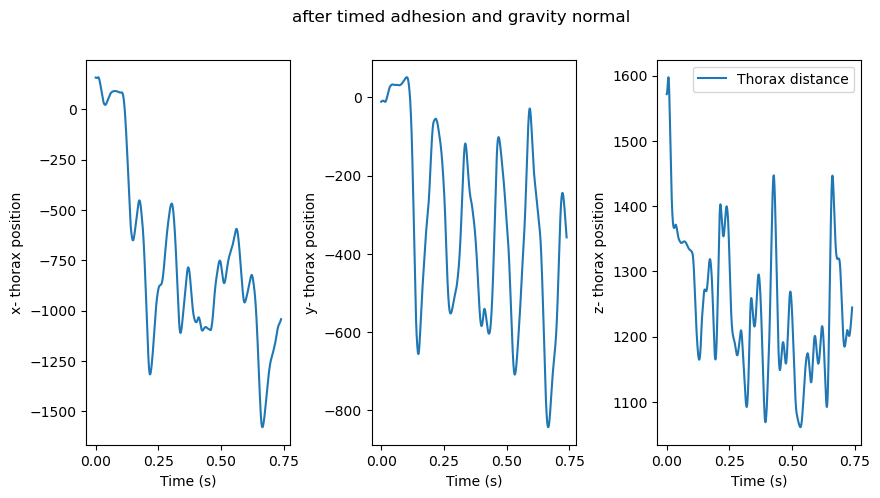

In [39]:
axis = ['x', 'y','z']
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))

for idx, ax in enumerate(axes): 
    #fig.add_subplot(np.arange(len([obs['fly'][0][i] for obs in obs_list])) * nmf.timestep, 130 + i, [obs['fly'][0][i] for obs in obs_list], label = "Thorax distance", xlabel = "time", ylabel = axis[i] + "thorax position" )
    ax.plot(np.arange(len([obs['fly'][0][idx] for obs in obs_list])) * nmf.timestep,[obs['fly'][0][idx] for obs in obs_list], label = "Thorax distance")
    ax.set_ylabel(axis[idx]+ "- thorax position")
    ax.set_xlabel('Time (s)')
plt.legend()
plt.subplots_adjust(wspace=0.4)

# plt.ylabel('x- Position end_effectors')
plt.suptitle('after timed adhesion and gravity normal')

Calculating the euclidian distance: 


In [40]:
distance_evolution = np.linalg.norm([obs['fly'][0] - obs_list[0]['fly'][0] for obs in obs_list], axis = 1)

Text(0.5, 0.5, 'final distance: 1290.5164969698178')

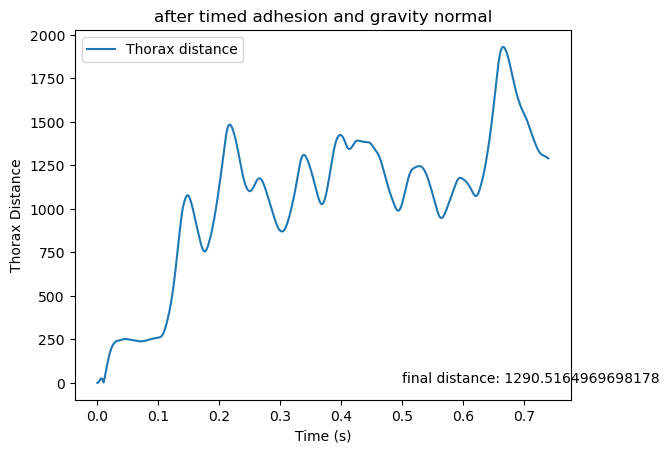

In [41]:
plt.plot(np.arange(np.shape(distance_evolution)[0]) * nmf.timestep,
    distance_evolution,
    label="Thorax distance")
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Thorax Distance')
plt.title('after timed adhesion and gravity normal')
plt.text(0.5, 0.5, f"final distance: {distance_evolution[-1]}")

7391


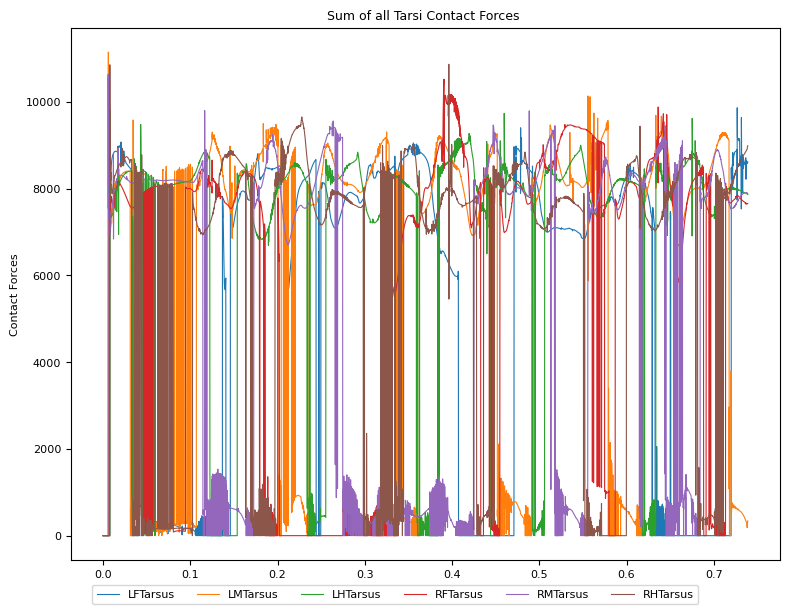

7391


<Figure size 640x480 with 0 Axes>

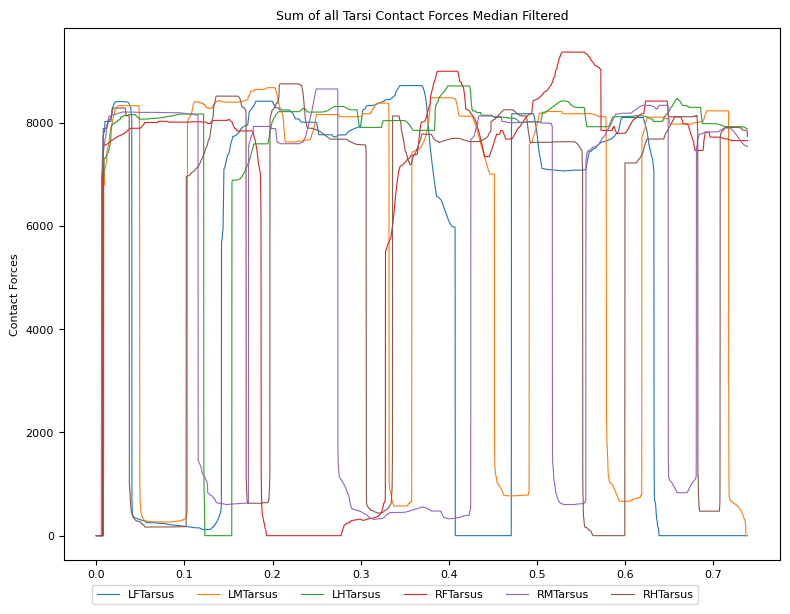

7391


<Figure size 640x480 with 0 Axes>

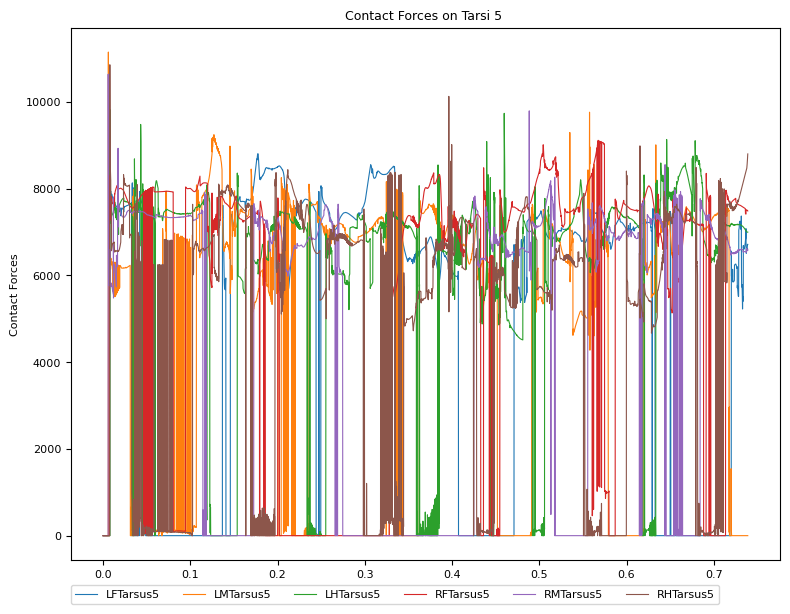

7391


<Figure size 640x480 with 0 Axes>

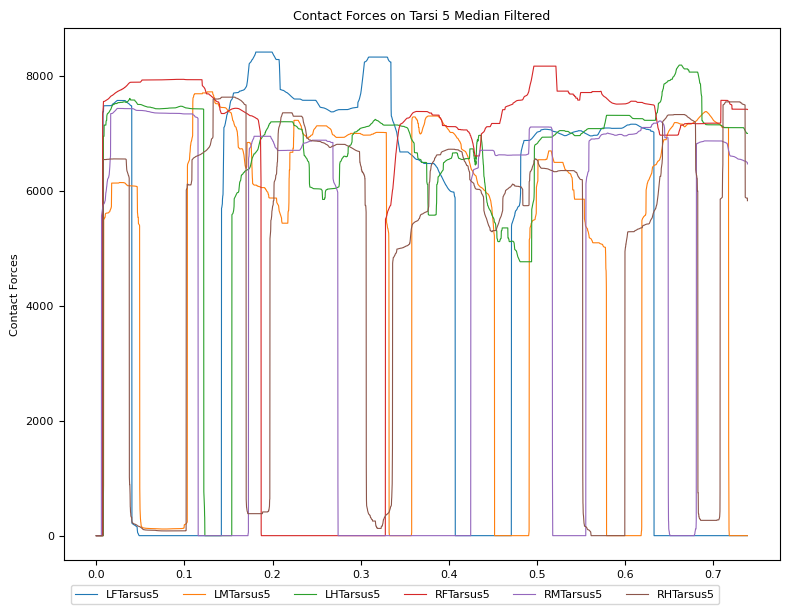

<Figure size 640x480 with 0 Axes>

In [42]:
plot_contact_forces(obs_list,bool_sum_of_allTarsi=True)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=True, window_size_medfilt= window_size_medfilt)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=False)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=False, window_size_medfilt=window_size_medfilt)

In [43]:
video_path = Path('PreRunAdhesion_Videos/video_noADH_modifs_MCoxa_45_MHscale1_5_Fscale0_75_left_view_ADHESION.mp4')
nmf.save_video(video_path)

from ipywidgets import Video
Video.from_file(video_path)

KeyError: 'fps'

# 3nd run: Add Adhesion, Gravity inverted 

In [ ]:
#so that the fly doesnt directly fly away.
adhesion_obs = np.where(np.array(derivative)>= 0, 1, 0)
adhesion_obs[:n_stabilisation_steps] = np.ones(6) 


In [ ]:
# Run simulation
obs, info = nmf.reset() 
nmf.physics.model.opt.gravity = (0,0,9.81e5)
adhesion_gain_multiply = 20
old_obs = obs
obs_list = [obs]
for idx in range(num_steps + n_stabilisation_steps):
    if idx < n_stabilisation_steps:
        joint_pos = data_block[:, 0] 
        action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*np.array(adhesion_obs)[0,:]}
    else: 

        joint_pos = data_block[:, idx-n_stabilisation_steps] #put back i 
        #calculate adhesion
        action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*np.array(adhesion_obs)[idx,:]} 
    old_obs = obs
    obs, info = nmf.step(action)
    
    nmf.render()
    obs_list.append(obs)

100%|██████████| 7390/7390 [00:59<00:00, 124.73it/s]


In [ ]:
end_effector_data = extract_end_effector_data_xyz(obs_list)

In [ ]:
#plotting end_effector_data
plot_xyz_pos_endeffectors(end_effector_data)

In [ ]:
afterrun_inv_grav_contact = []
for obs in obs_list:
    afterrun_inv_grav_contact.append(obs['contact_forces'][4::5])  

# Thorax displacement 

Text(0.5, 0.98, 'after timed adhesion and gravity inverted')

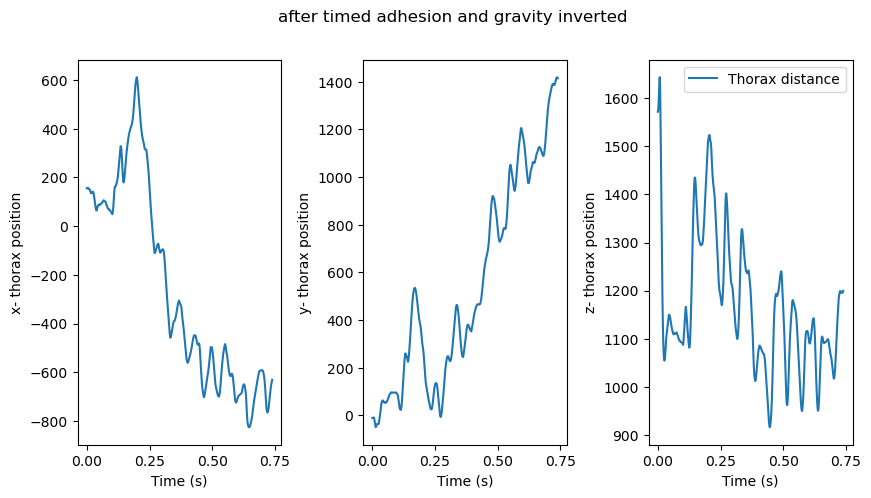

In [ ]:
axis = ['x', 'y','z']
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))

for idx, ax in enumerate(axes): 
    #fig.add_subplot(np.arange(len([obs['fly'][0][i] for obs in obs_list])) * nmf.timestep, 130 + i, [obs['fly'][0][i] for obs in obs_list], label = "Thorax distance", xlabel = "time", ylabel = axis[i] + "thorax position" )
    ax.plot(np.arange(len([obs['fly'][0][idx] for obs in obs_list])) * nmf.timestep,[obs['fly'][0][idx] for obs in obs_list], label = "Thorax distance")
    ax.set_ylabel(axis[idx]+ "- thorax position")
    ax.set_xlabel('Time (s)')
plt.legend()
plt.subplots_adjust(wspace=0.4)

# plt.ylabel('x- Position end_effectors')
plt.suptitle('after timed adhesion and gravity inverted')

Calculating the euclidian distance: 


In [ ]:
obs_list[0]['fly']

array([[ 1.56515377e+02, -1.06738401e+01,  1.57142617e+03],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-1.57063908e+00,  2.07869279e-04,  9.09672773e-01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

Text(0.5, 0.5, 'final distance: -787.4185127948008')

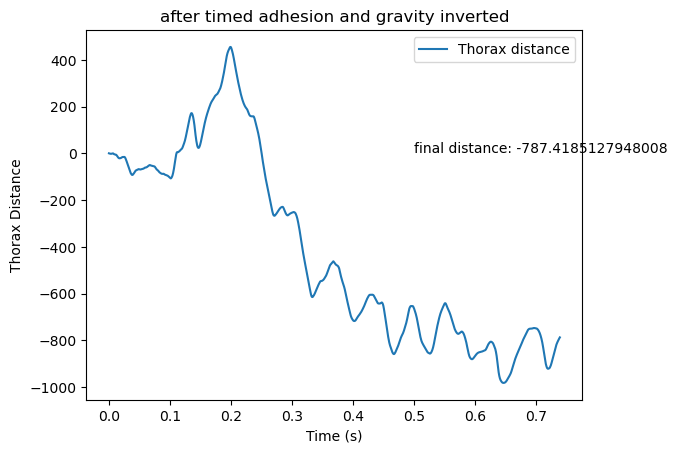

In [ ]:
distance_evolution = np.linalg.norm([obs['fly'][0] - obs_list[0]['fly'][0] for obs in obs_list], axis = 1)
x_distance_evolution = [obs['fly'][0][0] - obs_list[0]['fly'][0][0] for obs in obs_list]

plt.plot(np.arange(len(x_distance_evolution)) * nmf.timestep,
    x_distance_evolution,
    label="Thorax distance")
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Thorax Distance')
plt.title('after timed adhesion and gravity inverted')
plt.text(0.5, 0.5, f"final distance: {x_distance_evolution[-1]}")

Text(0.5, 0.5, 'final distance: 1670.5237603425974')

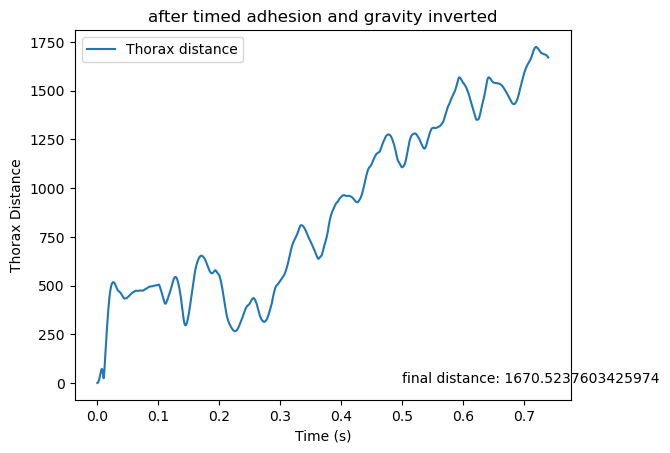

In [ ]:
plt.plot(np.arange(np.shape(distance_evolution)[0]) * nmf.timestep,
    distance_evolution,
    label="Thorax distance")
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Thorax Distance')
plt.title('after timed adhesion and gravity inverted')
plt.text(0.5, 0.5, f"final distance: {distance_evolution[-1]}")

In [ ]:
print(distance_evolution[-1])

1670.5237603425974


In [ ]:
video_path = Path('PreRunAdhesion_Videos/video_noADH_modifs_MCoxa_45_MHscale1_5_Fscale0_75_left_view_ADHESION_INVGrav.mp4')
nmf.save_video(video_path)

from ipywidgets import Video
Video.from_file(video_path)

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05MOmdat\x00\x00\…

7391


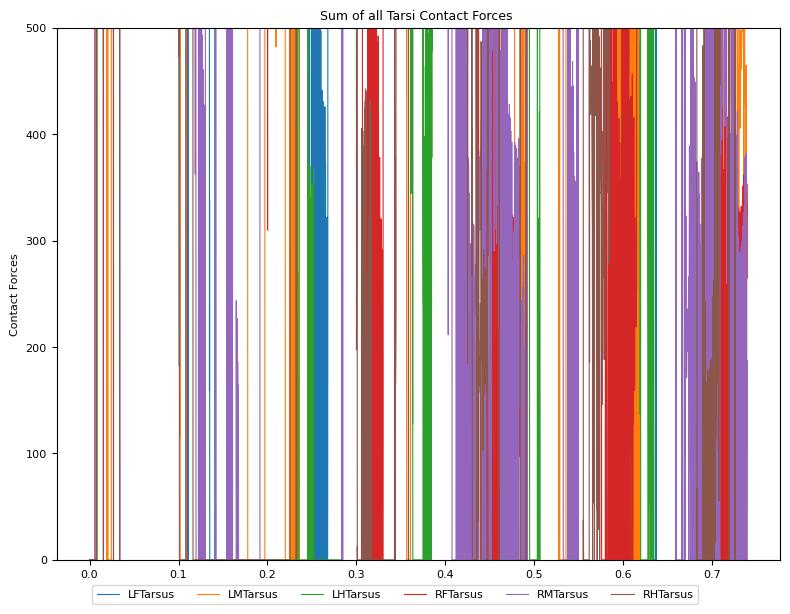

7391


<Figure size 640x480 with 0 Axes>

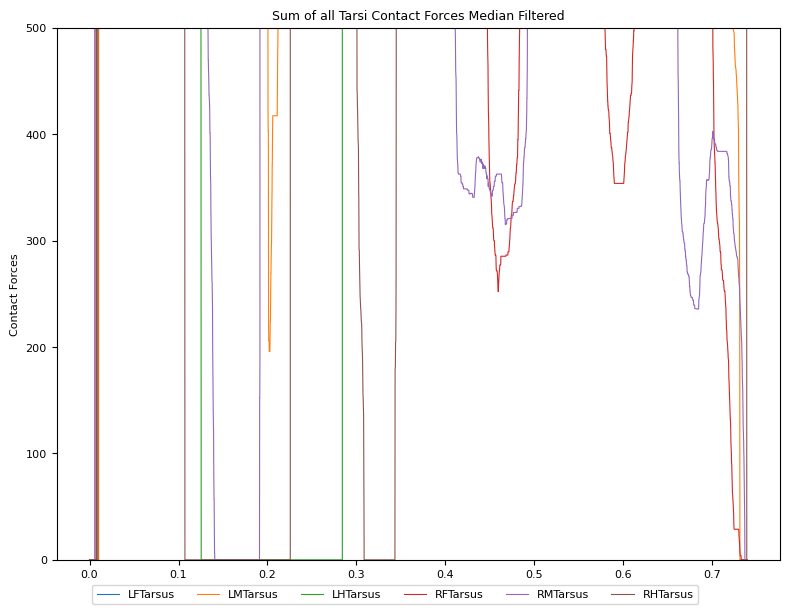

7391


<Figure size 640x480 with 0 Axes>

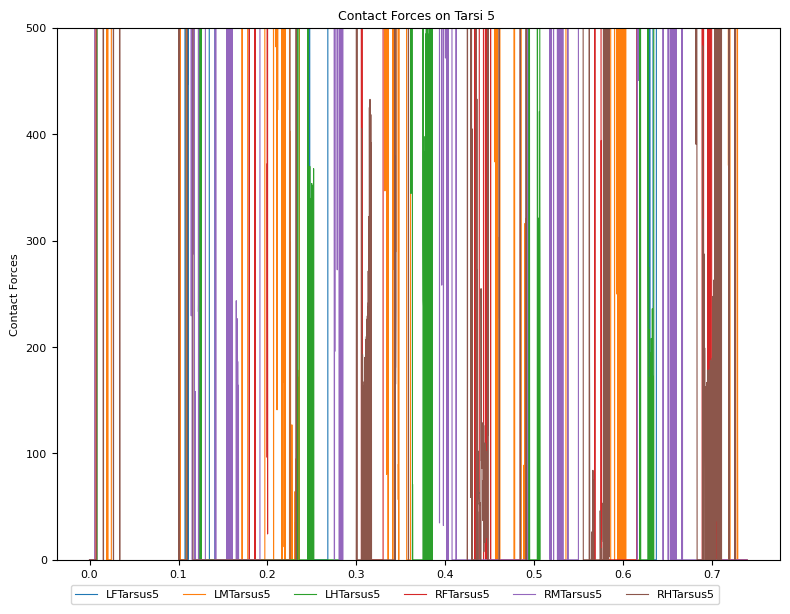

7391


<Figure size 640x480 with 0 Axes>

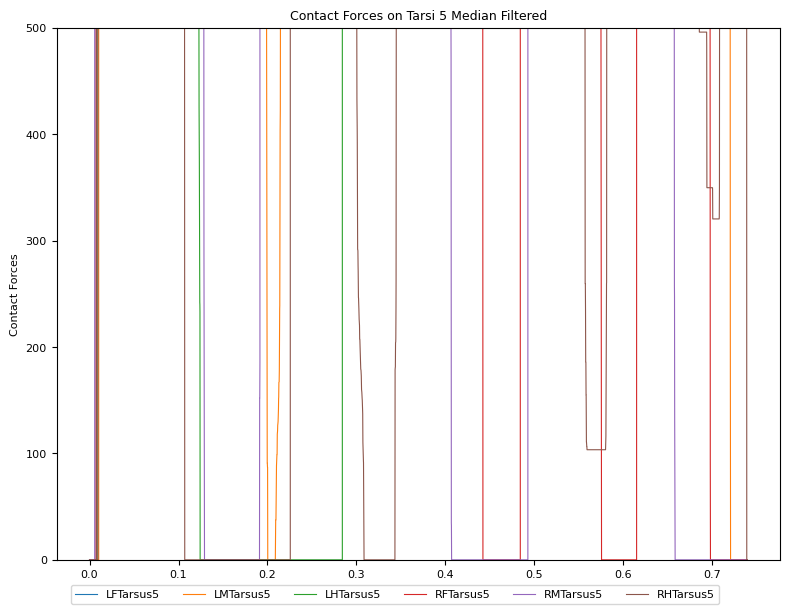

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_contact_forces(obs_list,bool_sum_of_allTarsi=True)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=True, window_size_medfilt= window_size_medfilt)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=False)
plot_contact_forces(obs_list,bool_sum_of_allTarsi=False, window_size_medfilt=window_size_medfilt)

# Dynamic 

In [ ]:
#so that the fly doesnt directly fly away.
adhesion_obs = np.where(np.array(derivative)>= 0, 1, 0)
adhesion_obs[:n_stabilisation_steps] = np.ones(6) 


In [30]:
def run_adhesion_sim_dynamic(nmf, data_block, num_steps, n_stabilisation_steps= 1000, bool_gravity_inv = False, adhesion_gain_multiply =1):
    #if adhesion_gain_multiply == 0 and bool_gravity_inv:
    #    raise ValueError("Error: 'adhesion multiplier' is zero, meaning adhesion is off and 'gravity is inverted' as bool_gravity_inv is True. This does not make sense. ")
    # Run simulation
    obs, info = nmf.reset() 
    if bool_gravity_inv:
        nmf.physics.model.opt.gravity = (0,0,9.81e5)
        if adhesion_gain_multiply == 0:
            nmf.physics.model.opt.gravity = (0,0,-9.81e5)
    else:
        nmf.physics.model.opt.gravity = (0,0,-9.81e5)
    print(f"gravity: {nmf.physics.model.opt.gravity}")
    # Run simulation
    window_size_medfilt =501
    obs, info = nmf.reset() 
    obs_list = [obs]
    deriv_list = []
    adhesion_list = []
    for idx in range(num_steps + n_stabilisation_steps):
        
        # Perform mirror padding on obs_list if necessary
        if len(obs_list) < window_size_medfilt:
            padding_size = window_size_medfilt - len(obs_list)
            padded_obs_list = np.pad(obs_list, [(padding_size, 0)], mode='reflect')
        else:
            padded_obs_list = obs_list
        if bool_sum_of_allTarsi:

            medold = np.median([[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in padded_obs_list[-window_size_medfilt-1:-2]], axis = 0)
            #print(f'medold {medold}')
            mednew = np.median([[np.sum(obs['contact_forces'][i*5:i*5 + 5]) for i in np.arange(6)] for obs in padded_obs_list[-window_size_medfilt:-1]], axis = 0)
            #print(f'medonew {mednew}')
            derivative = (mednew-medold) / nmf.timestep
            #print(derivative)
        else:

            medold = np.median([obs['contact_forces'][4::5] for obs in padded_obs_list[-window_size_medfilt-1:-2]], axis = 0)
            mednew = np.median([obs['contact_forces'][4::5] for obs in padded_obs_list[-window_size_medfilt:-1]], axis = 0)
            derivative = (mednew-medold) / nmf.timestep
            #print(derivative)
            #so that the fly doesnt directly fly away.
        if idx == 0:
            derivative = np.zeros(6)
        deriv_list.append(derivative)
        assert adh_rule in adh_rules, "you must add a new adhesion rule"

        if adh_rule == '>=':
            adhesion = np.where(np.array(derivative)>= 0, 1, 0)



  

        elif adh_rule == ">":
            adhesion = np.where(np.array(derivative)>= 0, 1, 0)    

        if adhesion_gain_multiply == 0:
            adhesion = np.zeros(6)
            

        if idx < n_stabilisation_steps:
            joint_pos = data_block[:, 0] 
            adhesion = np.ones(6) 
            action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*adhesion}
        else: 

            joint_pos = data_block[:, idx-n_stabilisation_steps] #put back i 
            #calculate adhesion
            action = {'joints': joint_pos, 'adhesion': adhesion_gain_multiply*adhesion} #old version: action = {'joints': joint_pos, 'adhesion': obs['bodies_adhesion']}
        #print(derivative)
        adhesion_list.append(adhesion)
        obs, info = nmf.step(action)
        
        nmf.render()
        obs_list.append(obs)
    return obs_list, adhesion_list, deriv_list

>
True
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]


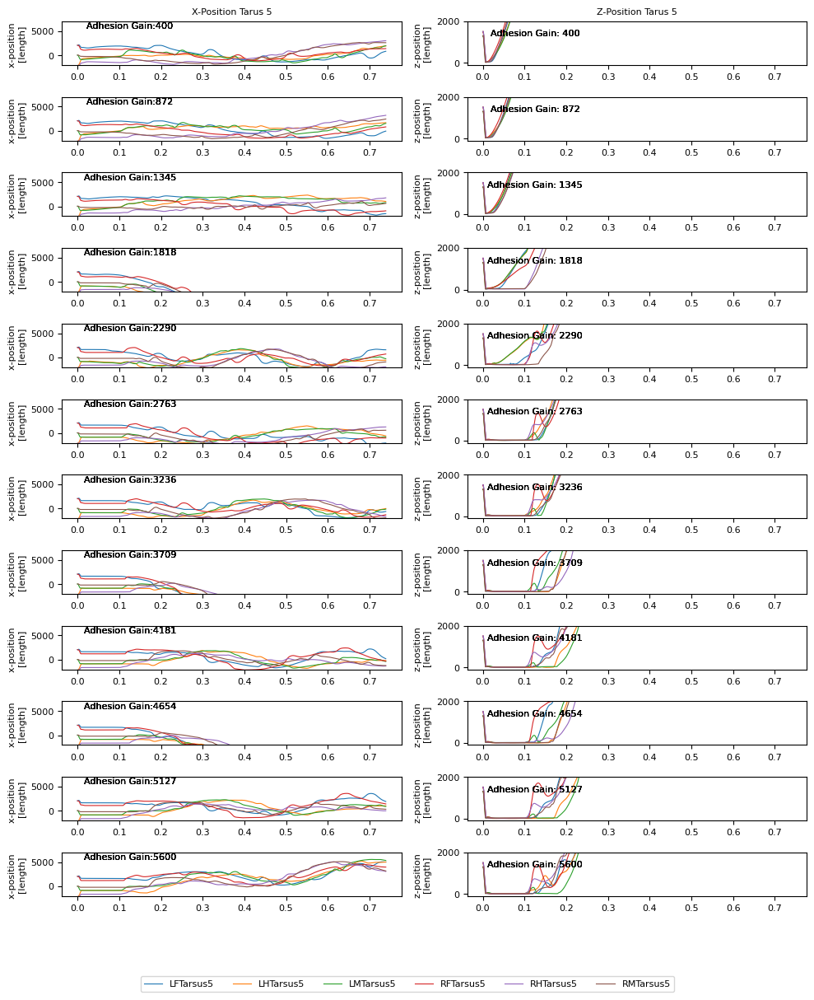

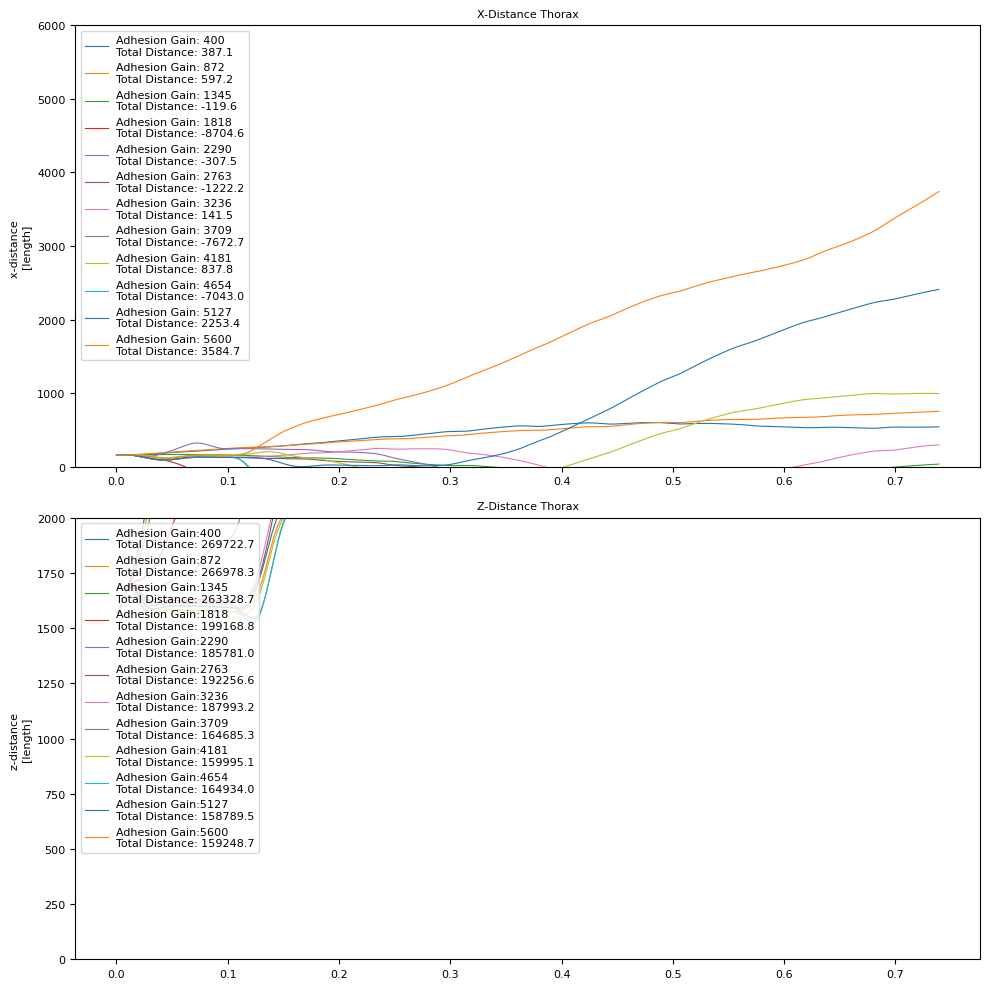

False
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]


<Figure size 640x480 with 0 Axes>

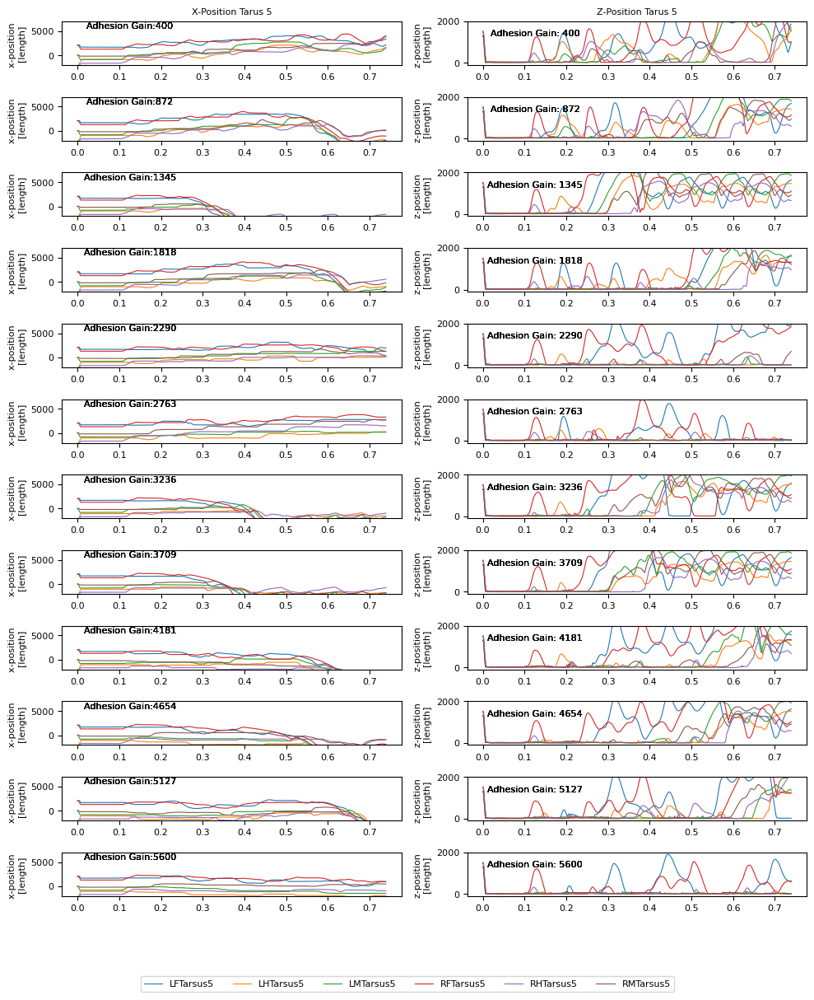

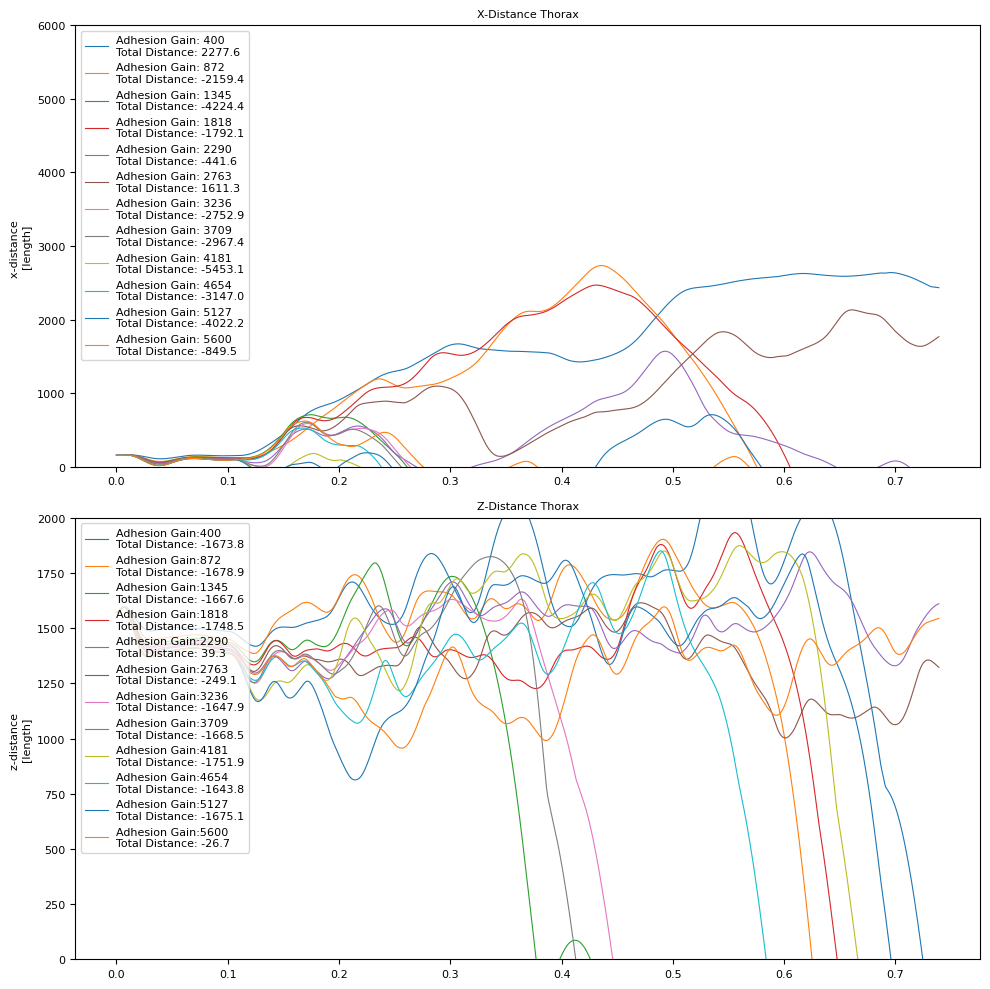

>=
True
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]
gravity: [     0.      0. 981000.]


<Figure size 640x480 with 0 Axes>

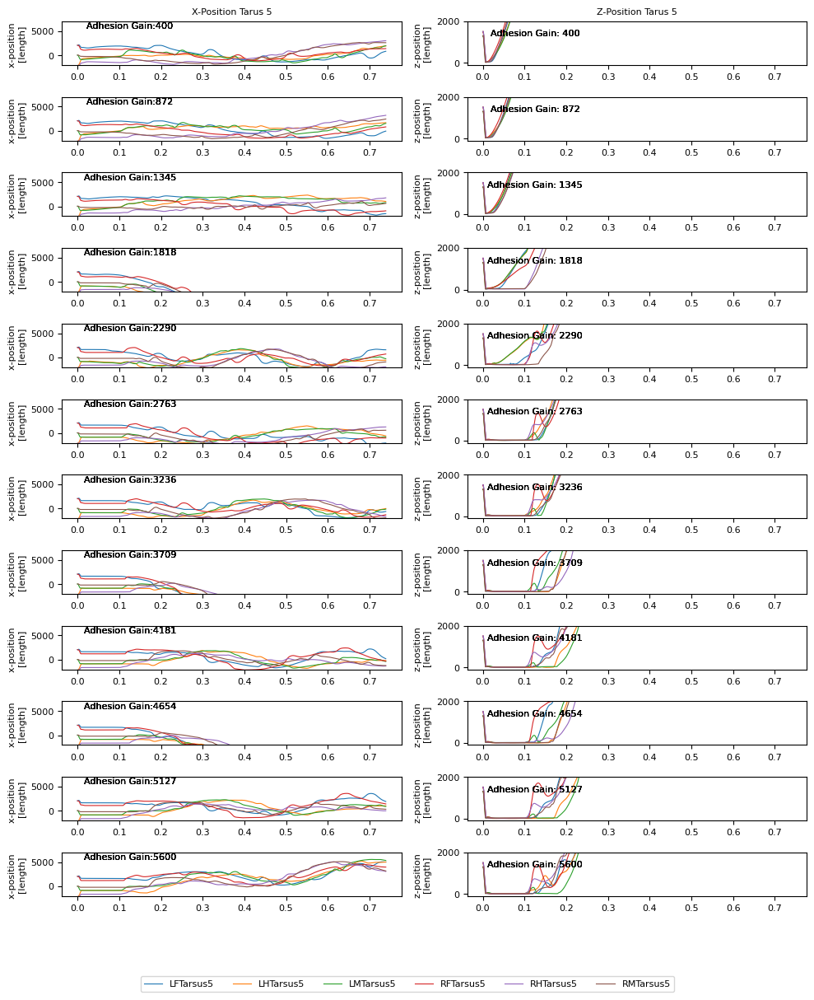

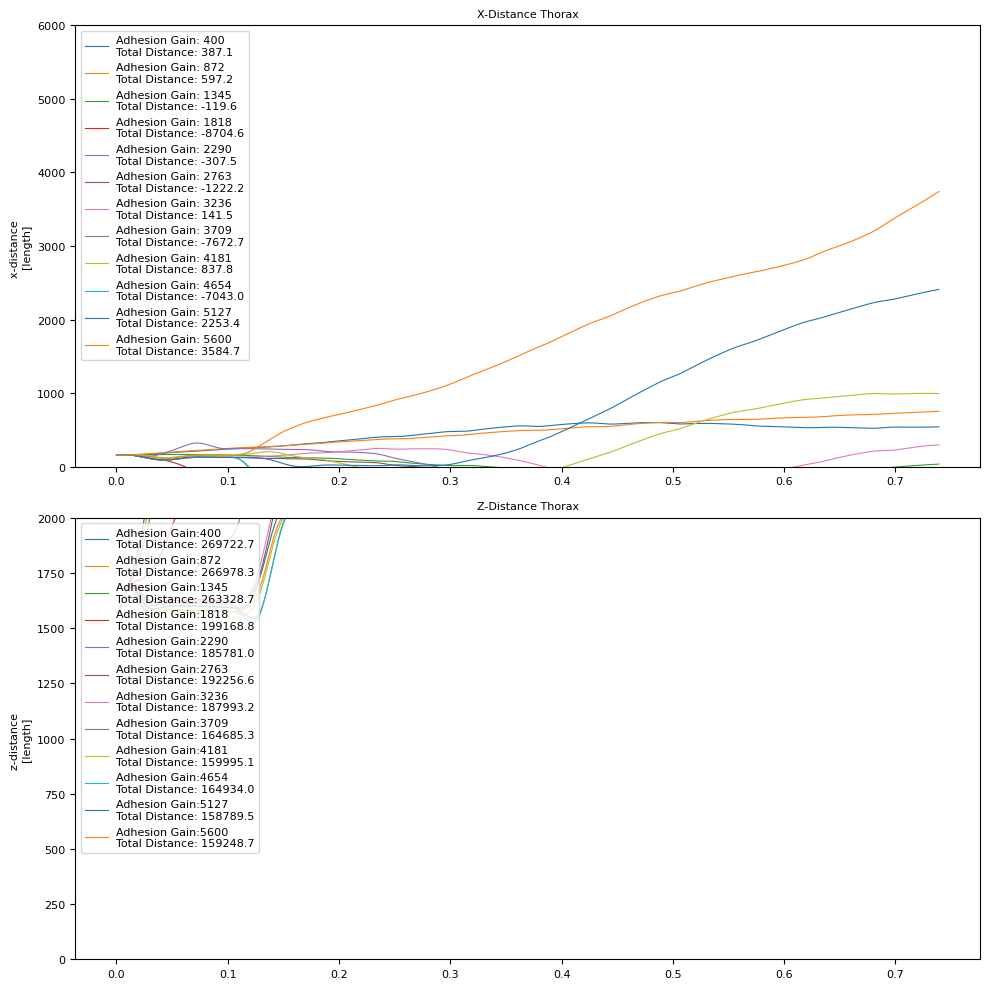

False
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]
gravity: [      0.       0. -981000.]


<Figure size 640x480 with 0 Axes>

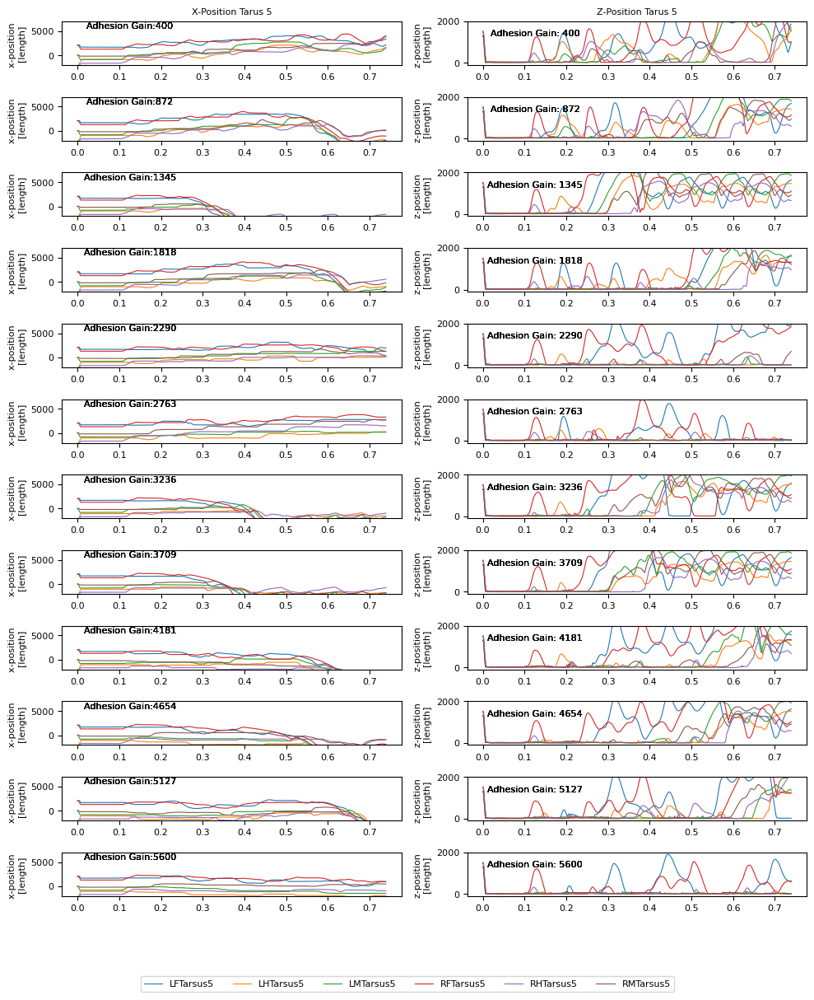

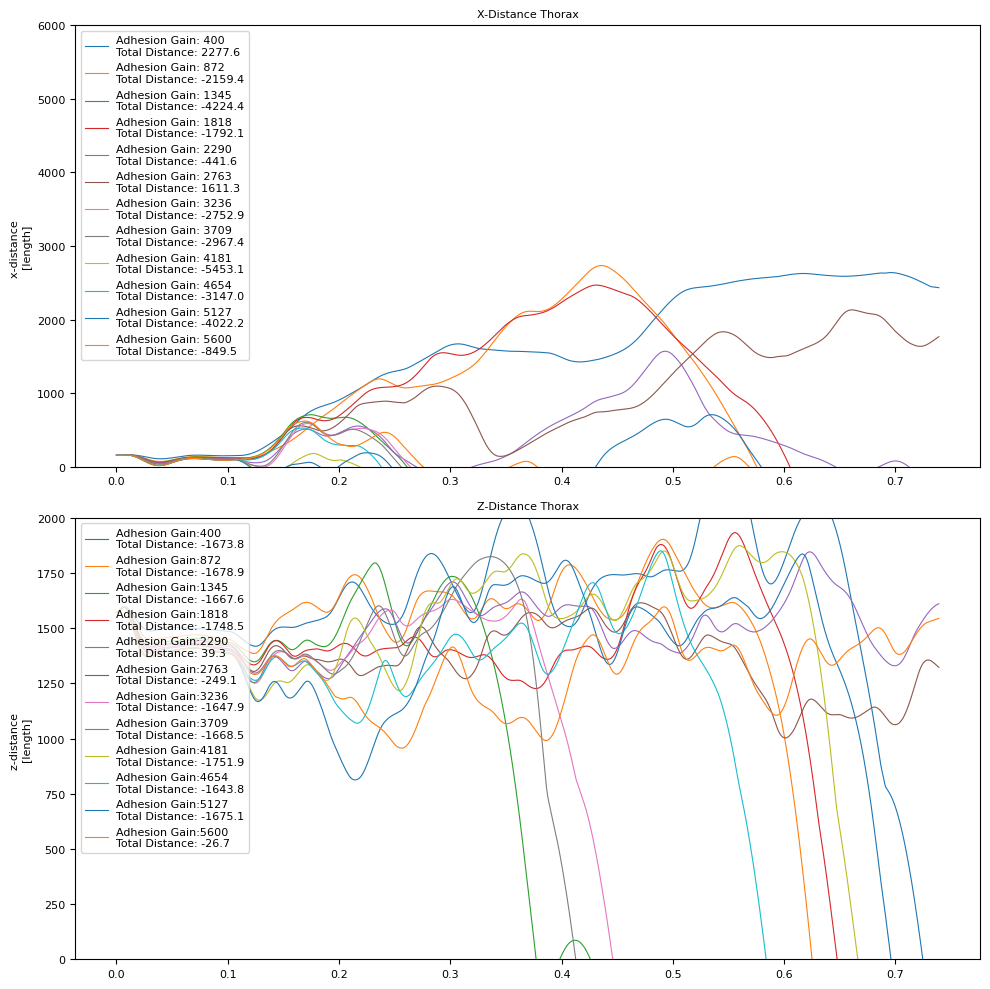

<Figure size 640x480 with 0 Axes>

In [33]:
adhesion_gain_multipliers = np.linspace(0.05,0.7,12)#np.array([0.25,0.5,0.75,1,2,4,8])
adhesion_gain_multipliers_og = adhesion_gain_multipliers.copy()


bool_gravity_inv_lists = [True,False]
#bool_gravity_inv = True # False: normal gravity, True: inv gravity
adh_rules = [">", ">="]
#bool_gravity_inv_lists = False
#adh_rules =">"
#adh_rule = ">="

for adh_rule in adh_rules:
    print(adh_rule)
    for bool_gravity_inv in bool_gravity_inv_lists:
        if bool_gravity_inv:
            adhesion_gain_multipliers = adhesion_gain_multipliers_og.copy()
            if adh_rule == ">=": 
                savefig_path_effector_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
            else: 
                savefig_path_effector_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
        else:
            adhesion_gain_multipliers = adhesion_gain_multipliers_og.copy()
            if adh_rule == ">=":
                savefig_path_effector_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Effectors_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
                savefig_path_distance_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Dist_GravInv{bool_gravity_inv}_rule_biggerEq_inverted_at_01s.png')
            else: 
                savefig_path_effector_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Effectors_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
                savefig_path_distance_dyn = Path('notebooks/PreRunAdhesionFigures',f'DynMethod_Dist_GravInv{bool_gravity_inv}_rule_bigger_inverted_at_01s.png')
 
        print(bool_gravity_inv)
        #for end_effectors figure
        fig_all_endeffectors_grid_dynamic = plt.figure(figsize=(10,12))
        fig_all_displacements_grid_dynamic = plt.figure(figsize=(10,10))
        gridsize = len(adhesion_gain_multipliers) # nr of params in the grid (10) + the normal one
        nr_axes_endeffectors = 2
        nr_axes_displacement = 2

        for idx, adhesion_gain_multiplier in enumerate(adhesion_gain_multipliers):
            obs_list, adhesion_list, deriv_list = run_adhesion_sim_dynamic(nmf, data_block, num_steps, n_stabilisation_steps, bool_gravity_inv, adhesion_gain_multiplier)
            
            #print(obs_list)
            actual_gain_adh = nmf.actuators_adhesion_gain * adhesion_gain_multiplier  
            #print(actual_gain_adh)       
            end_effector_data = extract_end_effector_data_xyz(obs_list)
            #print(end_effector_data)
            fig_all_endeffectors_grid_dynamic =  plot_xyz_endeffectors_grid(end_effector_data, fig_all_endeffectors_grid_dynamic,gridsize, nr_axes_endeffectors, idx, actual_gain_adh)
            fig_all_displacements_grid_dynamic = plot_displacement_grid(obs_list, fig_all_displacements_grid_dynamic, gridsize,nr_axes_displacement,subfigure_idx=idx, actual_gain_adh=actual_gain_adh, bool_gravity_inv=bool_gravity_inv)
            #print(actual_gain_adh)
        fig_all_endeffectors_grid_dynamic.legend(labels = nmf.end_effector_names, loc = 'center', ncol = len(nmf.end_effector_names), bbox_to_anchor=(0.5,0), fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_endeffectors_grid_dynamic.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_endeffectors_grid_dynamic)

        #fig_all_displacements_grid.legend(fontsize = 8)
        #fig_all_endeffectors_grid.text(0.5, 0.04, "time[s]", ha='center', )
        fig_all_displacements_grid_dynamic.tight_layout()
        #fig_all_endeffectors_grid.text(0.04, 0.5, "position", va='center', rotation='vertical')
        plt.figure(fig_all_displacements_grid_dynamic)
        plt.show()
        plt.draw()
        fig_all_endeffectors_grid_dynamic.savefig(savefig_path_effector_dyn)
        fig_all_displacements_grid_dynamic.savefig(savefig_path_distance_dyn)